In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize, LogNorm, ListedColormap
import h5py
import sys
sys.path.append('../')
sys.path.append('../pywrdrb/')

import plotting
from plotting.plotting_functions import *


### compare flows at gages downstream of reservoirs

In [2]:
### directories
from utils.directories import input_dir, fig_dir, output_dir


# Constants
cms_to_mgd = 22.82
cm_to_mg = 264.17/1e6
cfs_to_mgd = 0.0283 * 22824465.32 / 1e6


### list of reservoirs and major flow points to compare across models
reservoir_list = ['cannonsville', 'pepacton', 'neversink', 'wallenpaupack', 'prompton', 'shoholaMarsh', \
                   'mongaupeCombined', 'beltzvilleCombined', 'fewalter', 'merrillCreek', 'hopatcong', 'nockamixon', \
                   'assunpink', 'ontelaunee', 'stillCreek', 'blueMarsh', 'greenLane']
reservoir_list_nyc = reservoir_list[:3]

majorflow_list = ['delLordville', 'delMontague', 'delTrenton', 'outletAssunpink', 'outletSchuylkill',
                  '01425000', '01417000', '01436000', '01433500', '01449800',
                  '01447800', '01463620', '01470960']

reservoir_link_pairs = {'cannonsville': '01425000',
                           'pepacton': '01417000',
                           'neversink': '01436000',
                           'mongaupeCombined': '01433500',
                           'beltzvilleCombined': '01449800',
                           'fewalter': '01447800',
                           'assunpink': '01463620',
                           'blueMarsh': '01470960'}




In [4]:
### focus on results since FFMP 2007

# start_date = '1983-10-01'
start_date = '2008-01-01'
end_date = '2016-12-31'

    
## Load data    
# Load Pywr-DRB simulation models
print('Retrieving simulation data.')
pywr_models = ['obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled', 'nhmv10', 'nwmv21']#, 'WEAP_29June2023_gridmet']

reservoir_downstream_gages = {}
major_flows = {}
datetime_index = None

for model in pywr_models:
    print(model)
    reservoir_downstream_gages[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'reservoir_downstream_gage', datetime_index=datetime_index)
    reservoir_downstream_gages[f'pywr_{model}'] = reservoir_downstream_gages[f'pywr_{model}'].loc[start_date:end_date,:]
    
    major_flows[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'major_flow', datetime_index=datetime_index)
    major_flows[f'pywr_{model}'] = major_flows[f'pywr_{model}'].loc[start_date:end_date,:]
pywr_models = [f'pywr_{m}' for m in pywr_models]

# Load base (non-pywr) models
base_models = ['obs', 'obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled', 'nhmv10', 'nwmv21']#, 'WEAP_29June2023_gridmet']

for model in base_models:
    print(model)
    reservoir_downstream_gages[model], datetime_index = get_base_results(input_dir, model, datetime_index, 'reservoir_downstream_gage')
    reservoir_downstream_gages[model] = reservoir_downstream_gages[model].loc[start_date:end_date,:]
    major_flows[model], datetime_index = get_base_results(input_dir, model, datetime_index, 'major_flow')
    major_flows[model] = major_flows[model].loc[start_date:end_date,:]

# # Verify that all datasets have same datetime index
# for r in reservoir_downstream_gages.values():
#     assert ((r.index == datetime_index).mean() == 1)
# for r in major_flows.values():
#     assert ((r.index == datetime_index).mean() == 1)
# print(f'Successfully loaded {len(base_models)} base model results & {len(pywr_models)} pywr model results')

Retrieving simulation data.
obs_pub_nhmv10_NYCScaled
obs_pub_nwmv21_NYCScaled
nhmv10
nwmv21
obs
obs_pub_nhmv10_NYCScaled
obs_pub_nwmv21_NYCScaled
nhmv10
nwmv21


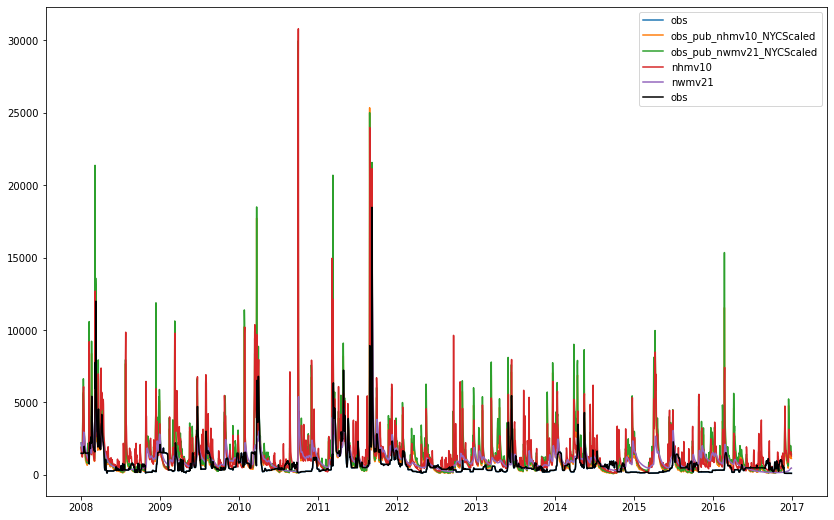

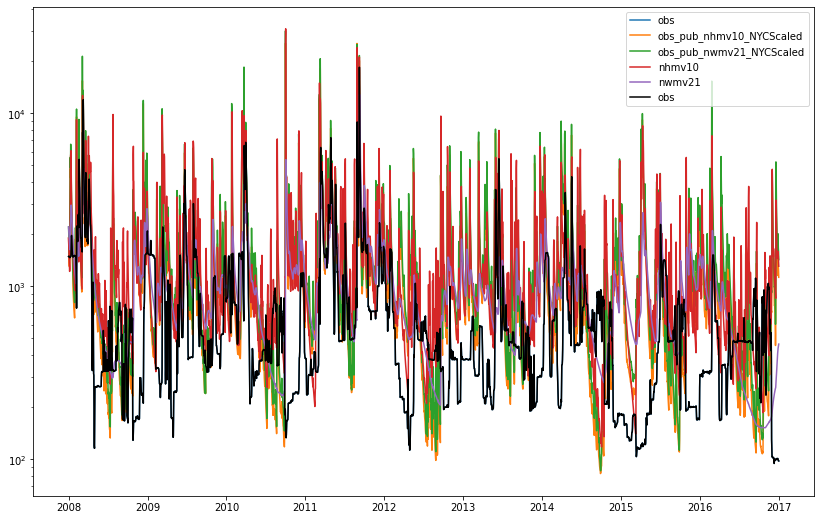

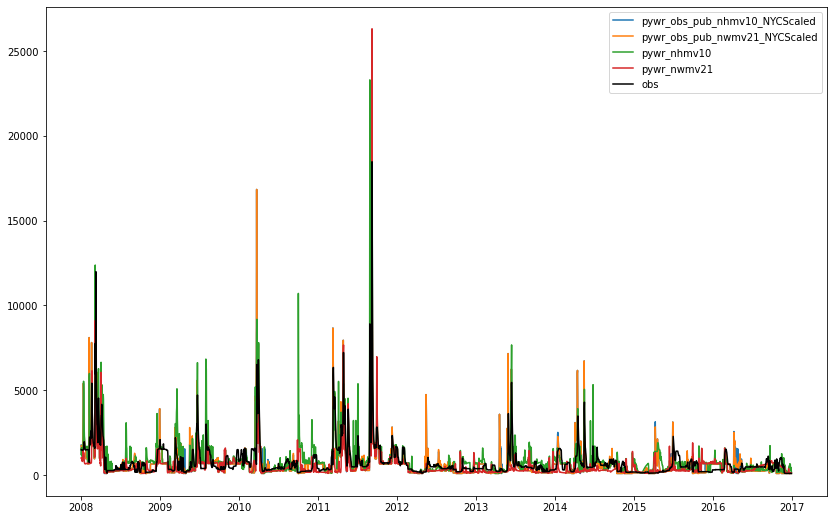

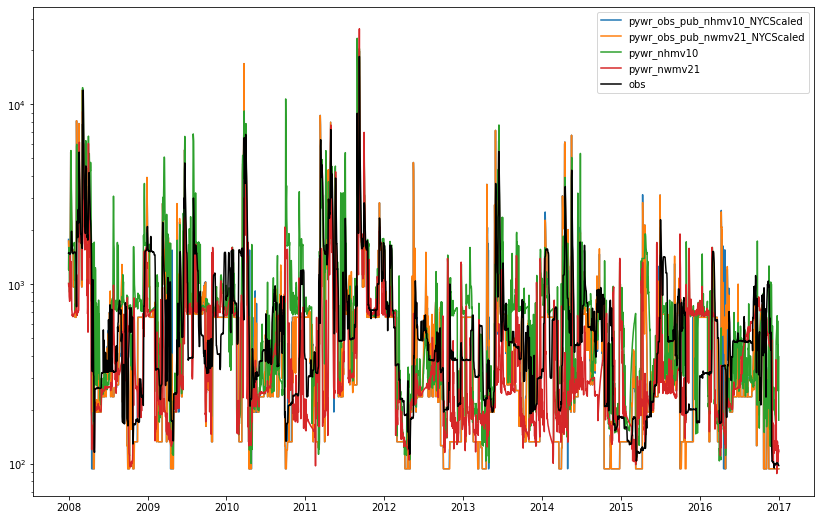

In [5]:
reservoirs = ['pepacton','cannonsville','neversink']
plt.figure(figsize=(14,9))
for model in base_models:
    flows = reservoir_downstream_gages[model]
    plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label=model)
flows = reservoir_downstream_gages['obs']
plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label='obs', c='k')
plt.legend()

plt.figure(figsize=(14,9))
for model in base_models:
    flows = reservoir_downstream_gages[model]
    plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label=model)
flows = reservoir_downstream_gages['obs']
plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label='obs', c='k')
plt.yscale('log')
plt.legend()

plt.figure(figsize=(14,9))
for model in pywr_models:
    flows = reservoir_downstream_gages[model]
    plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label=model)
flows = reservoir_downstream_gages['obs']
plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label='obs', c='k')
plt.legend()

plt.figure(figsize=(14,9))
for model in pywr_models:
    flows = reservoir_downstream_gages[model]
    plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label=model)
flows = reservoir_downstream_gages['obs']
plt.plot(flows['pepacton']+flows['cannonsville']+flows['neversink'], label='obs', c='k')
plt.yscale('log')
plt.legend()

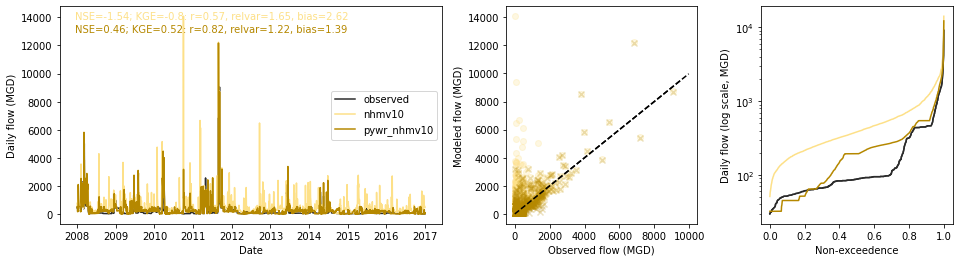

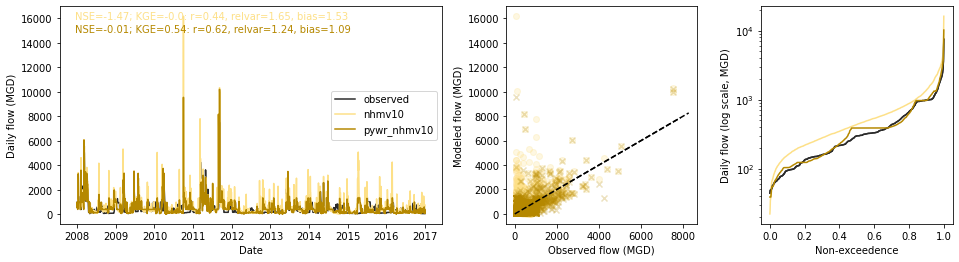

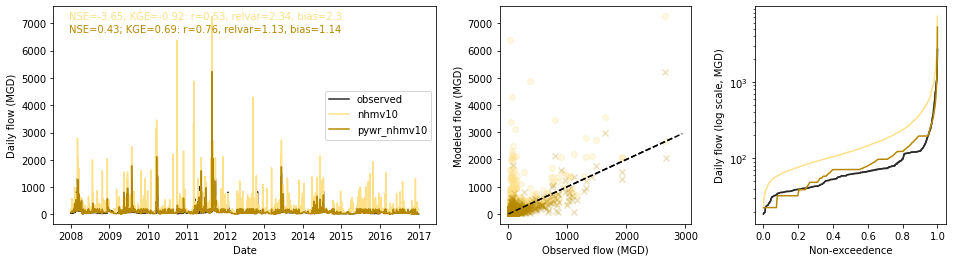

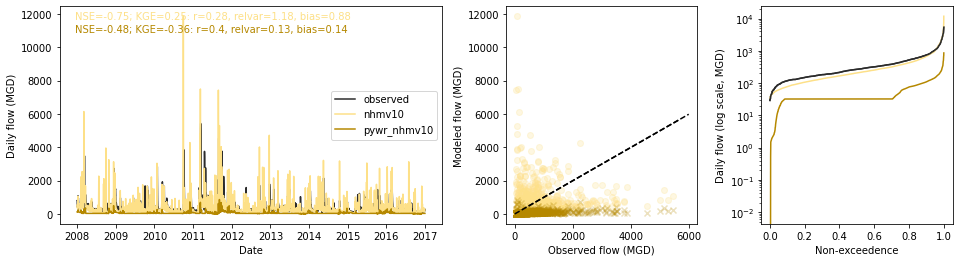

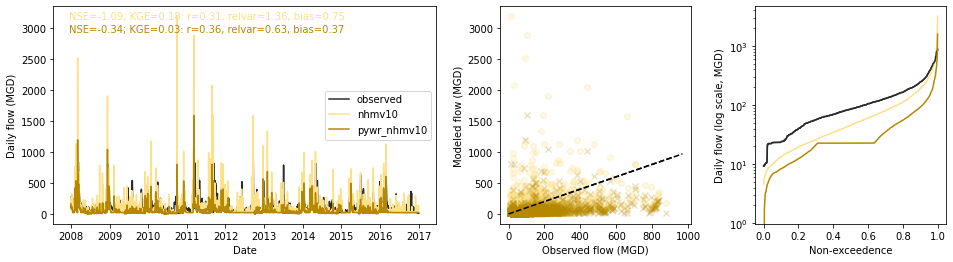

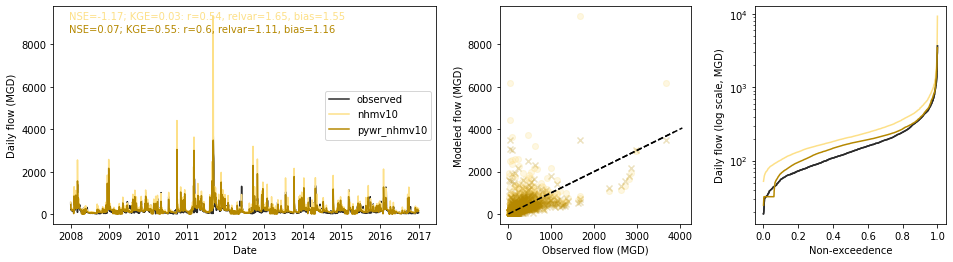

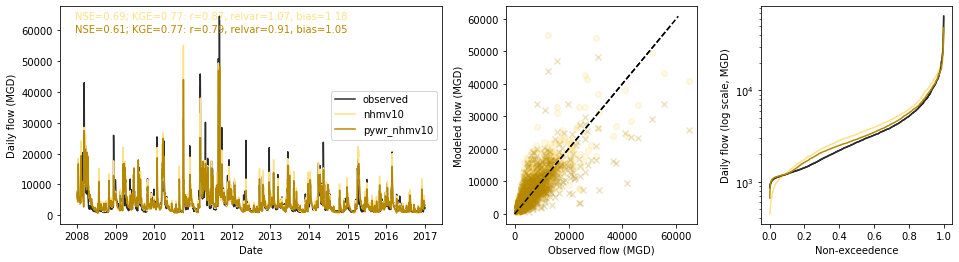

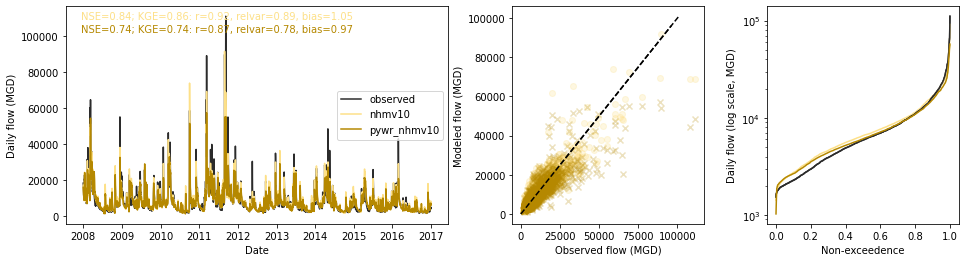

In [6]:
### flow comparison downstream of reservoirs - nhm
plot_3part_flows(reservoir_downstream_gages, ['nhmv10', 'pywr_nhmv10'], 'pepacton', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nhmv10', 'pywr_nhmv10'], 'cannonsville', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nhmv10', 'pywr_nhmv10'], 'neversink', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nhmv10', 'pywr_nhmv10'], 'fewalter', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nhmv10', 'pywr_nhmv10'], 'beltzvilleCombined', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nhmv10', 'pywr_nhmv10'], 'blueMarsh', save_fig=False)
plot_3part_flows(major_flows, ['nhmv10', 'pywr_nhmv10'], 'delMontague', save_fig=False)
plot_3part_flows(major_flows, ['nhmv10', 'pywr_nhmv10'], 'delTrenton', save_fig=False)

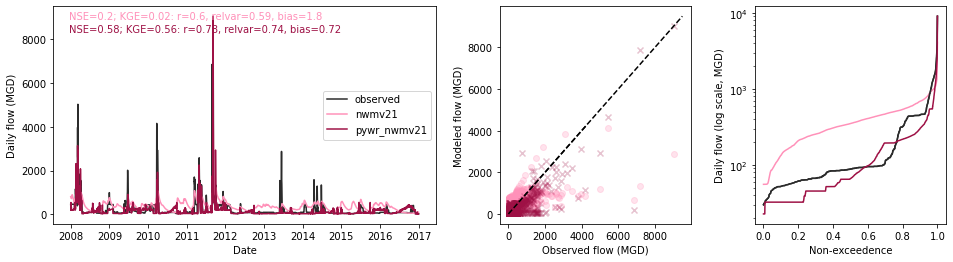

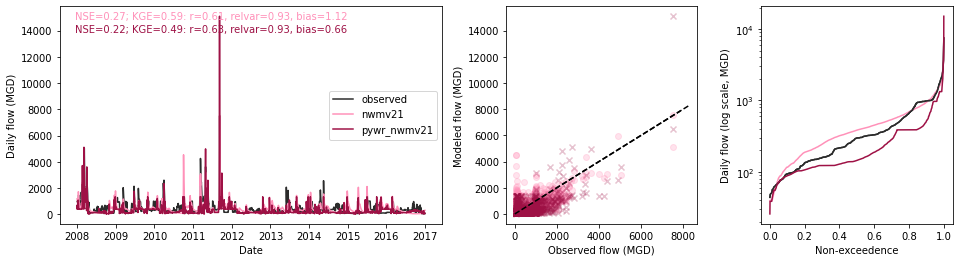

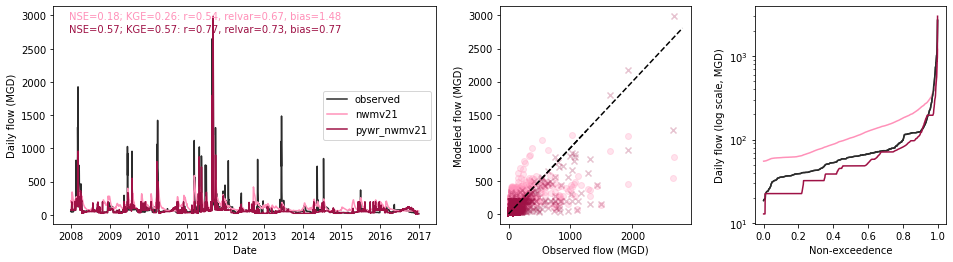

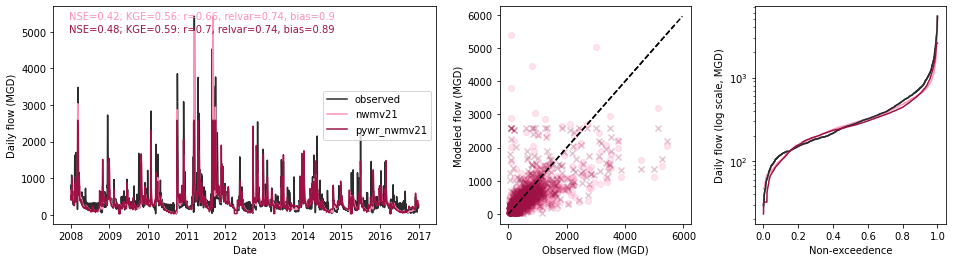

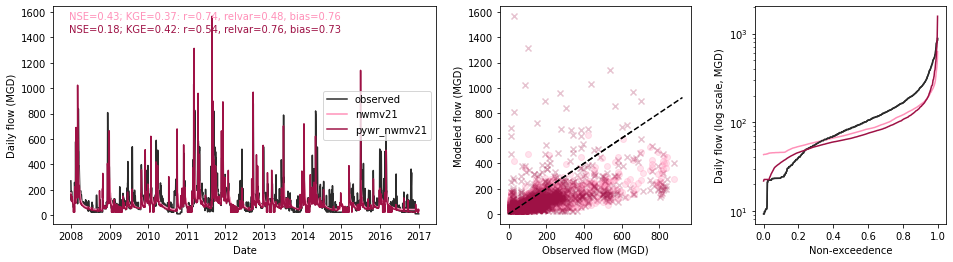

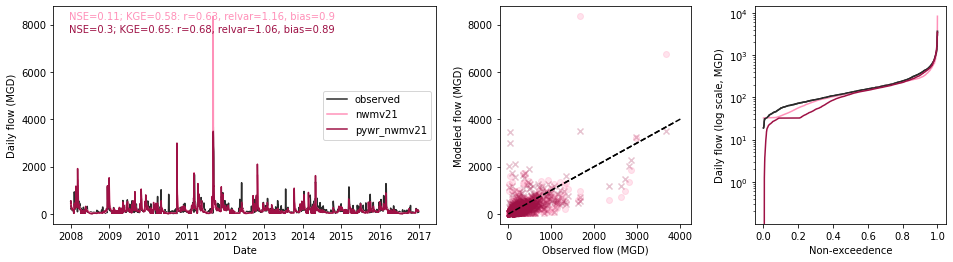

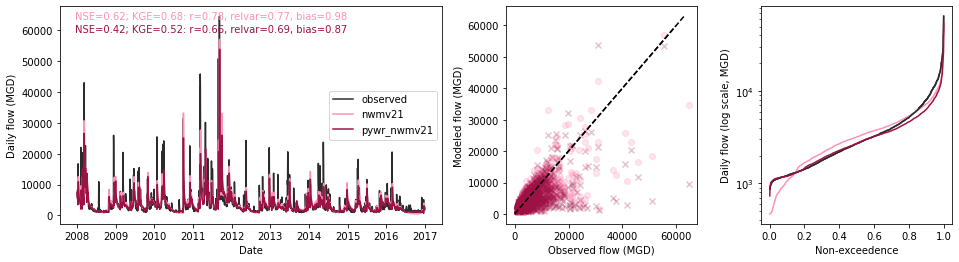

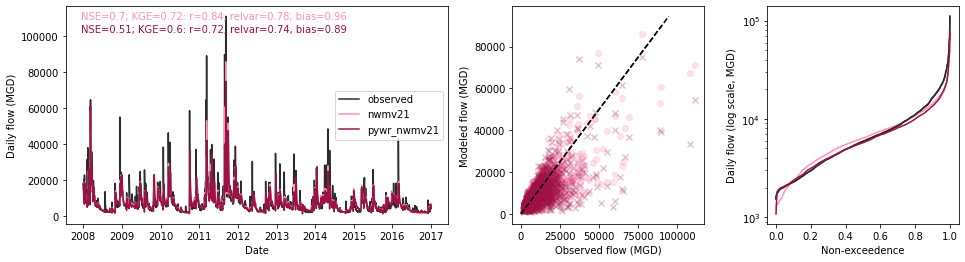

In [7]:
### flow comparison downstream of reservoirs - nwm
plot_3part_flows(reservoir_downstream_gages, ['nwmv21', 'pywr_nwmv21'], 'pepacton', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nwmv21', 'pywr_nwmv21'], 'cannonsville', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nwmv21', 'pywr_nwmv21'], 'neversink', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nwmv21', 'pywr_nwmv21'], 'fewalter', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nwmv21', 'pywr_nwmv21'], 'beltzvilleCombined', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['nwmv21', 'pywr_nwmv21'], 'blueMarsh', save_fig=False)
plot_3part_flows(major_flows, ['nwmv21', 'pywr_nwmv21'], 'delMontague', save_fig=False)
plot_3part_flows(major_flows, ['nwmv21', 'pywr_nwmv21'], 'delTrenton', save_fig=False) 

In [ ]:
# ### flow comparison downstream of reservoirs - weap
# plot_3part_flows(reservoir_downstream_gages, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'pepacton', save_fig=False)
# plot_3part_flows(reservoir_downstream_gages, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'cannonsville', save_fig=False)
# plot_3part_flows(reservoir_downstream_gages, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'neversink', save_fig=False)
# plot_3part_flows(reservoir_downstream_gages, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'fewalter', save_fig=False)
# plot_3part_flows(reservoir_downstream_gages, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'beltzvilleCombined', save_fig=False)
# plot_3part_flows(reservoir_downstream_gages, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'blueMarsh', save_fig=False)
# plot_3part_flows(major_flows, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'delMontague', save_fig=False)
# plot_3part_flows(major_flows, ['WEAP_29June2023_gridmet', 'pywr_WEAP_29June2023_gridmet'], 'delTrenton', save_fig=False) 

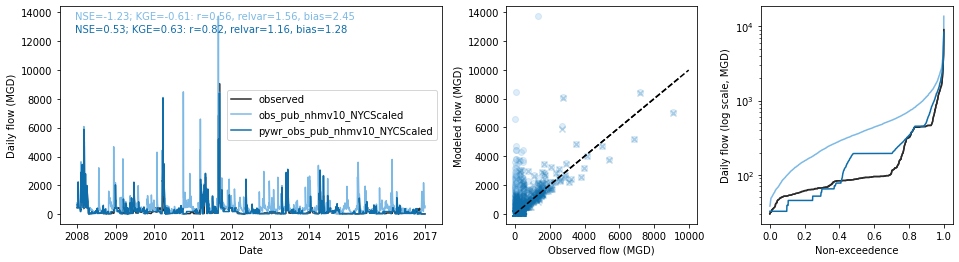

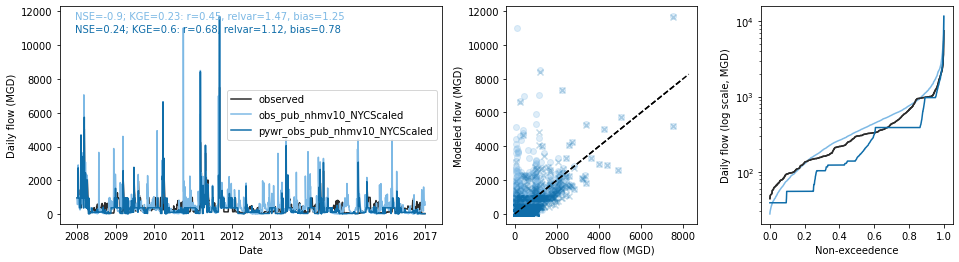

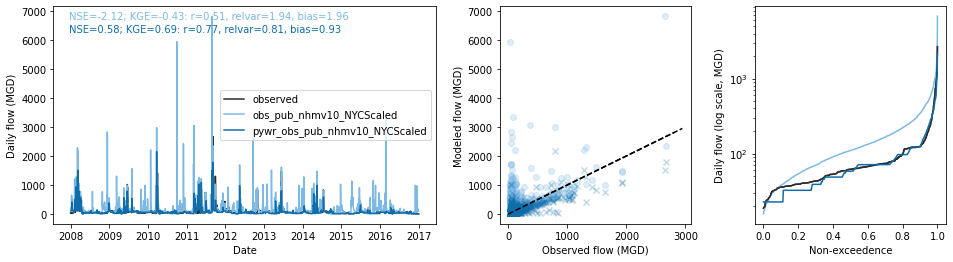

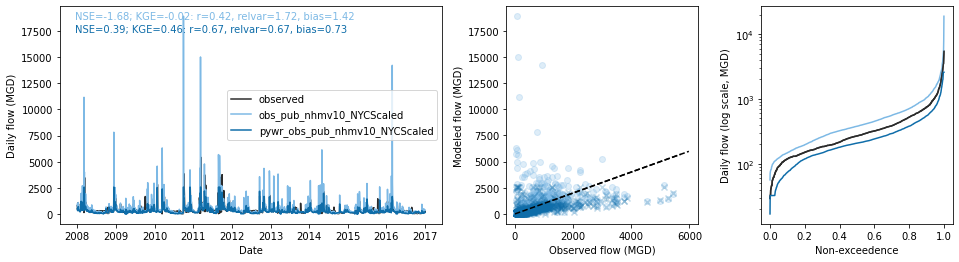

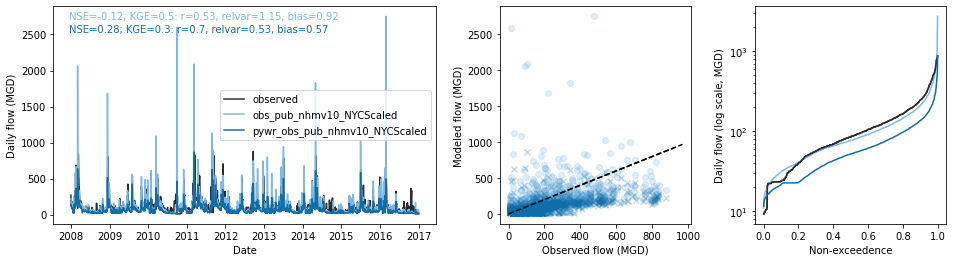

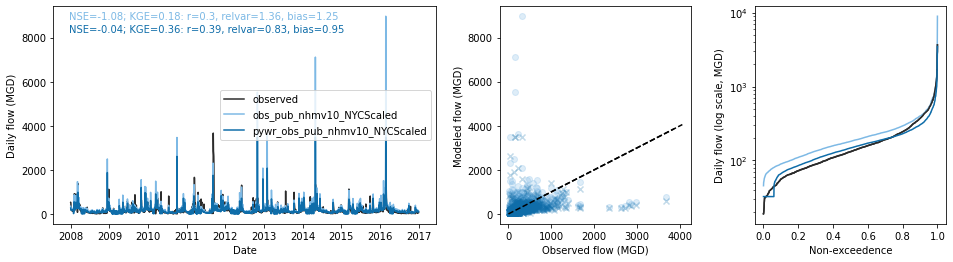

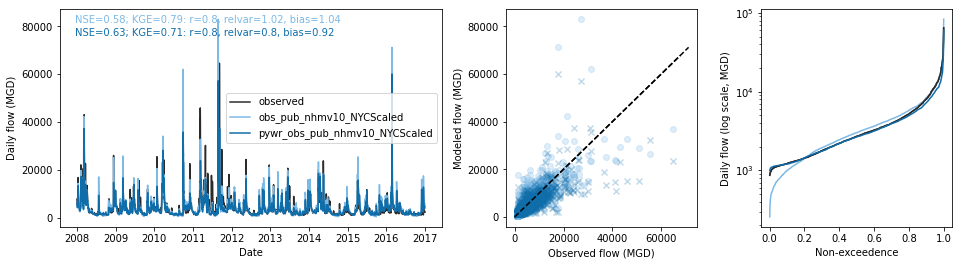

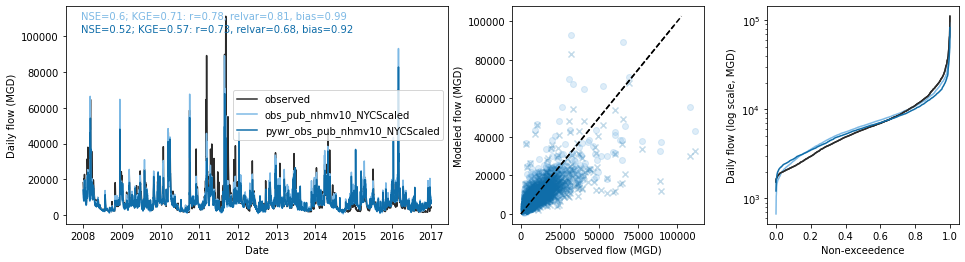

In [9]:
### flow comparison downstream of reservoirs - pub based on nhmv10
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'pepacton', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'cannonsville', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'neversink', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'fewalter', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'beltzvilleCombined', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'blueMarsh', save_fig=False)
plot_3part_flows(major_flows, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'delMontague', save_fig=False)
plot_3part_flows(major_flows, ['obs_pub_nhmv10_ObsScaled', 'pywr_obs_pub_nhmv10_ObsScaled'], 'delTrenton', save_fig=False)

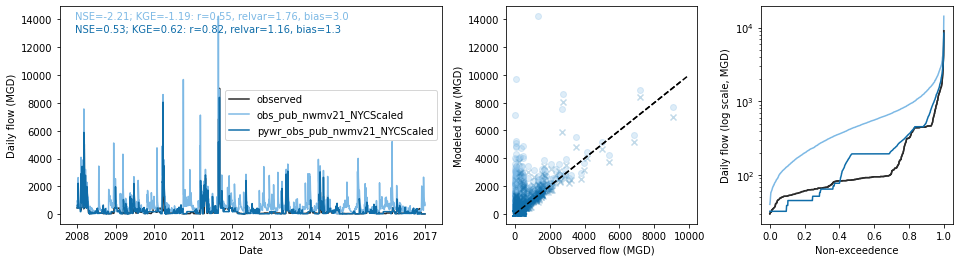

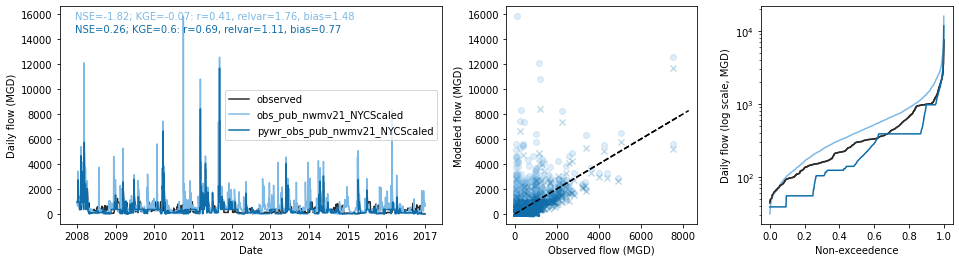

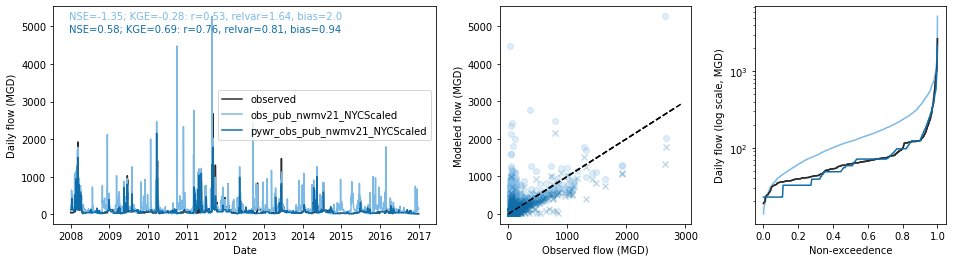

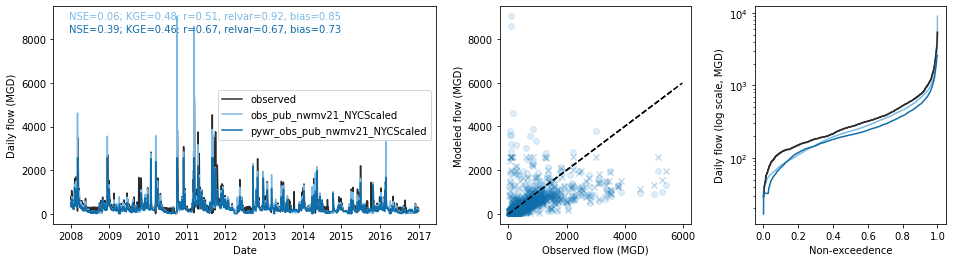

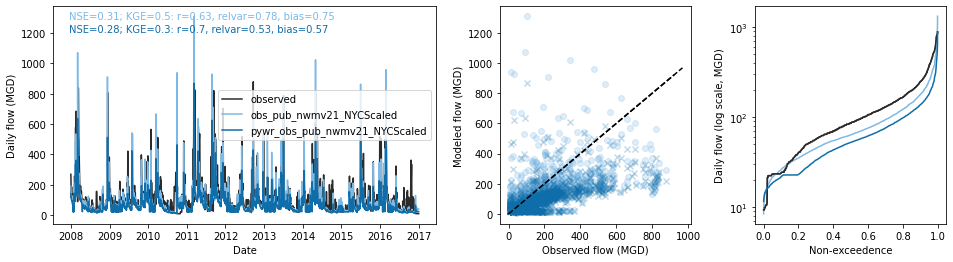

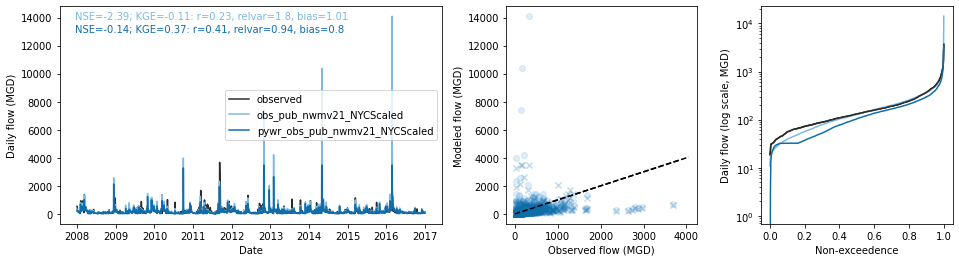

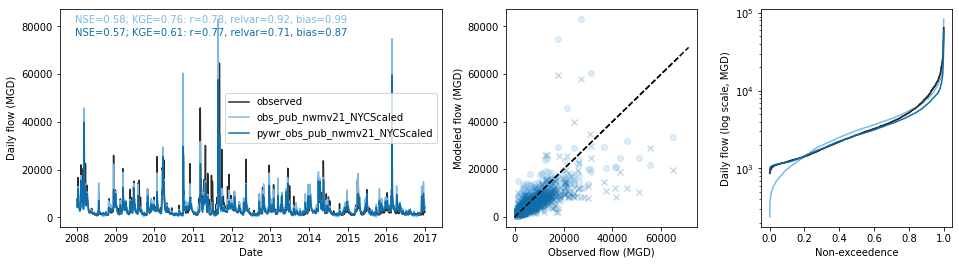

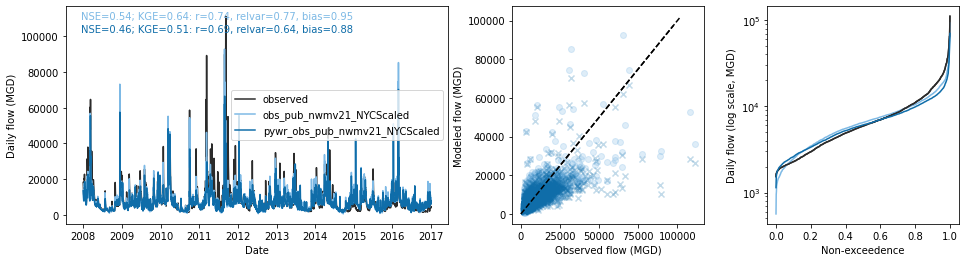

In [10]:
### flow comparison downstream of reservoirs - pub based on nwmv21
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'pepacton', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'cannonsville', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'neversink', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'fewalter', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'beltzvilleCombined', save_fig=False)
plot_3part_flows(reservoir_downstream_gages, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'blueMarsh', save_fig=False)
plot_3part_flows(major_flows, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'delMontague', save_fig=False)
plot_3part_flows(major_flows, ['obs_pub_nwmv21_ObsScaled', 'pywr_obs_pub_nwmv21_ObsScaled'], 'delTrenton', save_fig=False)

### rolling avg flow

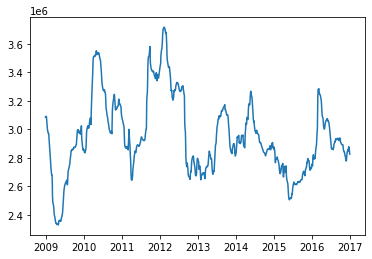

In [11]:
annflow = major_flows['obs_pub_nhmv10_ObsScaled']['delTrenton'].rolling(365).sum()
plt.plot(annflow)

### low-flow metrics

In [12]:
### get 7q10 flow for each estimate
def get_xQn_flow(data, x, n):
    ### find the worst x-day rolling average each year, then get the value of this with n-year return interval
    data_rolling = data.rolling(x).mean()[x:]
    data_rolling_annualWorst = data_rolling.resample('A').min()
    xQn = np.percentile(data_rolling_annualWorst, 100/n)
    return xQn
    
xlist = [1,7,30,90, 365]
nlist = [5, 10, 20, 30]
flow_metrics = {}
for x in xlist:
    for n in nlist:
        flow_metrics[f'{x}Q{n}'] = {}
        for reservoir in reservoir_list_nyc + ['beltzvilleCombined', 'blueMarsh', 'fewalter']:
            flow_metrics[f'{x}Q{n}'][reservoir] = {model: get_xQn_flow(reservoir_downstream_gages[model][reservoir], x, n) for model in pywr_models+base_models}
        for major in majorflow_list:
            flow_metrics[f'{x}Q{n}'][major] = {model: get_xQn_flow(major_flows[model][major], x, n) for model in pywr_models+base_models}    
    
# flow_metrics

In [13]:
major_flows['obs']['delTrenton'].rolling(365).mean()[365:].resample('A').min()

datetime
2008-12-31    9909.905761
2009-12-31    6739.164350
2010-12-31    8012.248035
2011-12-31    7581.070825
2012-12-31    6284.228577
2013-12-31    6170.127279
2014-12-31    6589.584542
2015-12-31    5030.034898
2016-12-31    5013.163131
Freq: A-DEC, Name: delTrenton, dtype: float64

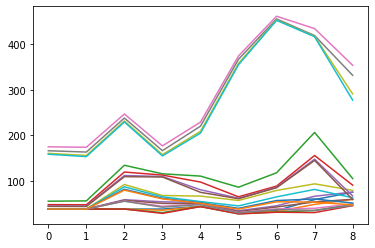

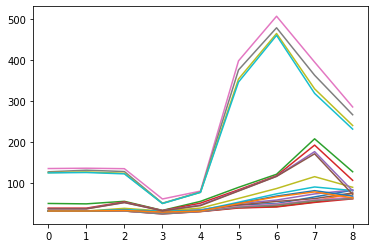

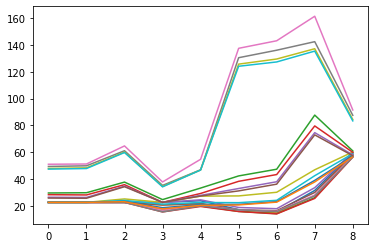

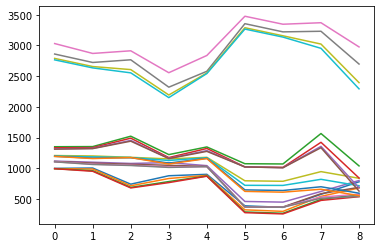

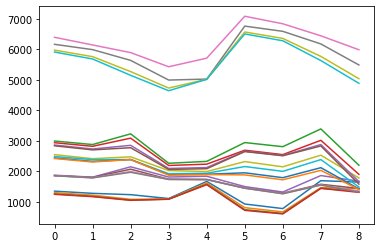

In [14]:
for node in ['cannonsville', 'pepacton', 'neversink', 'delMontague', 'delTrenton']:
    plt.figure()
    for x in xlist:
        for n in nlist:
            plt.plot(flow_metrics[f'{x}Q{n}'][node].values())

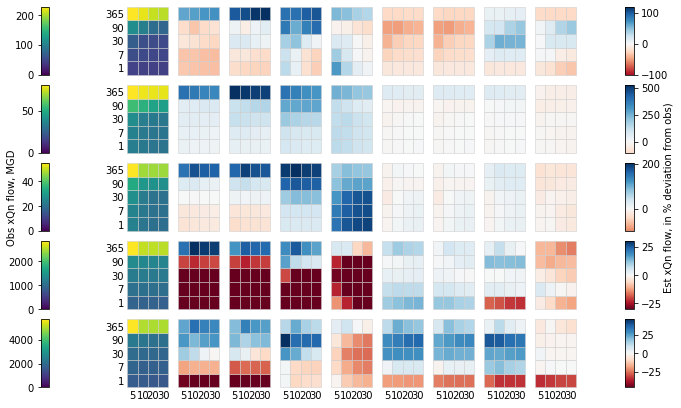

In [15]:
### plot low flow metric grid
models = base_models + pywr_models

nodes = ['cannonsville', 'pepacton', 'neversink', 'delMontague', 'delTrenton']

fig, axs = plt.subplots(len(nodes),1,figsize=(14,7),gridspec_kw={'hspace':0.15})

for ax,node in zip(axs, nodes):
    a = np.zeros((len(nlist),len(xlist), len(models)))
    for i, model in enumerate(models):
        count = 0
        for nn, n in enumerate(nlist):
            for xx,x in enumerate(xlist):
                if node in reservoir_list:
                    a[nn,xx, i] = get_xQn_flow(reservoir_downstream_gages[model][node], x, n)
                elif node in majorflow_list:
                    a[nn,xx, i] = get_xQn_flow(major_flows[model][node], x, n)
                count += 1
    for c in range(1, len(models)):
        a[:,:,c] = (a[:,:,c] - a[:, :, 0]) / a[:,:,0] * 100
                
    cnorm_obs = Normalize(vmin=0, vmax=a[:,:,0].max())
    sm_obs = cm.ScalarMappable(cmap='viridis', norm=cnorm_obs)
    cnorm_mod = Normalize(vmin=-a[:,:,1:].max(), vmax=a[:,:,1:].max())
    sm_mod = cm.ScalarMappable(cmap='RdBu', norm=cnorm_mod)
#     cnorm_mod = Normalize(vmin=-1000, vmax=1000)
#     sm_mod = cm.ScalarMappable(cmap='RdBu', norm=cnorm_mod)
    xmax = 0
    for i, model in enumerate(models):
        for nn, n in enumerate(nlist):
            for xx,x in enumerate(xlist):
                box = [Rectangle((nn+xmax,xx),1,1)]
                if i == 0:
                    color = sm_obs.to_rgba(a[nn,xx,i])
                else:
                    color = sm_mod.to_rgba(a[nn,xx,i])                    
                pc = PatchCollection(box, facecolor = color, edgecolor='0.8', lw=0.5)
                ax.add_collection(pc)
        xmax += xx+1
    ax.spines[['right','left','bottom', 'top']].set_visible(False)
    ax.set_xlim([0, xmax+1])
    ax.set_ylim([0, xx+1])
    if node == nodes[-1]:
        ax.set_xticks([v-0.5 for v in range(xmax) if v%(len(nlist)+1) > 0], nlist*len(models))
    else:
        ax.set_xticks([])
    ax.set_yticks(np.arange(0.5, xx+1), xlist)
    ax.tick_params(axis='both', which='both',length=0)
    if node == nodes[2]:
        fig.colorbar(sm_obs, ax=ax, location='left', aspect=8, label='Obs xQn flow, MGD')
        cb = fig.colorbar(sm_mod, ax=ax, location='right', aspect=8, label='Est xQn flow, in % deviation from obs)')
    else:
        fig.colorbar(sm_obs, ax=ax, location='left', aspect=8)
        cb = fig.colorbar(sm_mod, ax=ax, location='right', aspect=8)
    cb.ax.set_ylim([max(-100, -a[:,:,1:].max()),a[:,:,1:].max()])
#     cb.ax.set_ylim([-100,1000])
    
        

#     if node == 'cannonsville':
#         print(a)

In [16]:
print(models)

['obs', 'obs_pub_nhmv10_NYCScaled', 'obs_pub_nwmv21_NYCScaled', 'nhmv10', 'nwmv21', 'pywr_obs_pub_nhmv10_NYCScaled', 'pywr_obs_pub_nwmv21_NYCScaled', 'pywr_nhmv10', 'pywr_nwmv21']


### analyze reservoir storages

In [17]:
### load catchment withdrawal/consumption data

start_date = '1983-10-01'
# start_date = '2008-01-01'
end_date = '2017-01-01'

    
pywr_models = ['obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled', 'nhmv10', 'nwmv21']#,'WEAP_29June2023_gridmet'
res_storages = {}
res_levels = {}
res_releases = {}

for model in pywr_models:
    res_storages[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'res_storage', datetime_index=datetime_index)
    res_storages[f'pywr_{model}'] = res_storages[f'pywr_{model}'].loc[start_date:end_date,:]
    res_levels[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'res_level', datetime_index=datetime_index)
    res_levels[f'pywr_{model}'] = res_levels[f'pywr_{model}'].loc[start_date:end_date,:]
    res_releases[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'res_release', datetime_index=datetime_index)
    res_releases[f'pywr_{model}'] = res_releases[f'pywr_{model}'].loc[start_date:end_date,:]
    

pywr_models = [f'pywr_{m}' for m in pywr_models]

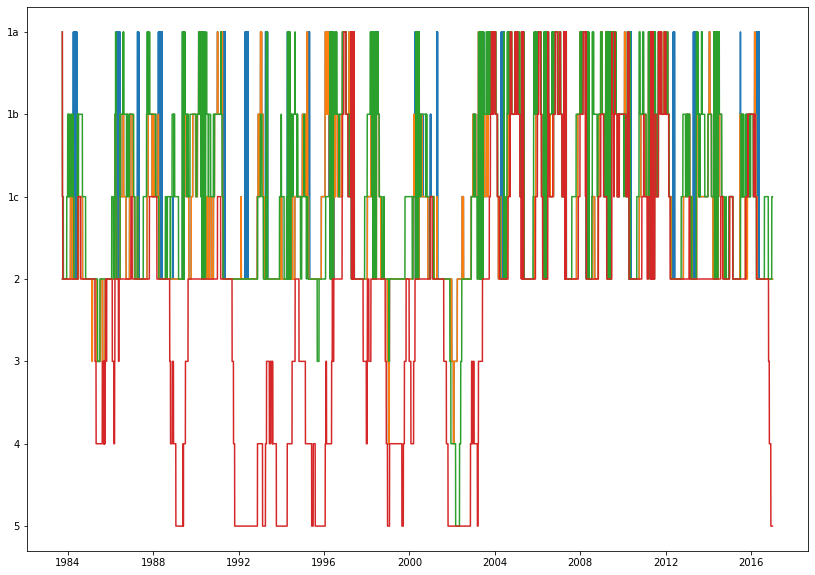

In [18]:
levels = ['1a','1b','1c','2','3','4','5']
plt.figure(figsize=(14,10))
for model in pywr_models:
    plt.plot(-res_levels[model]['nyc'])
_ = plt.yticks(range(0,-7, -1), levels)

In [19]:
### get historical NYC storages
hist_storages = pd.read_csv(f'{input_dir}/historic_NYC/NYC_storage_daily_2000-2021.csv', index_col=0)
hist_storages.index = pd.DatetimeIndex(hist_storages.index)
hist_storages = hist_storages.loc[start_date:end_date,:]

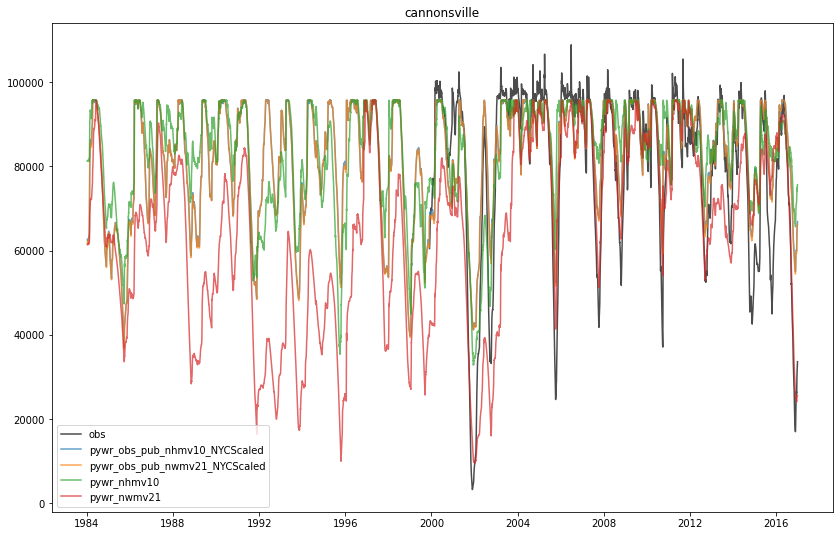

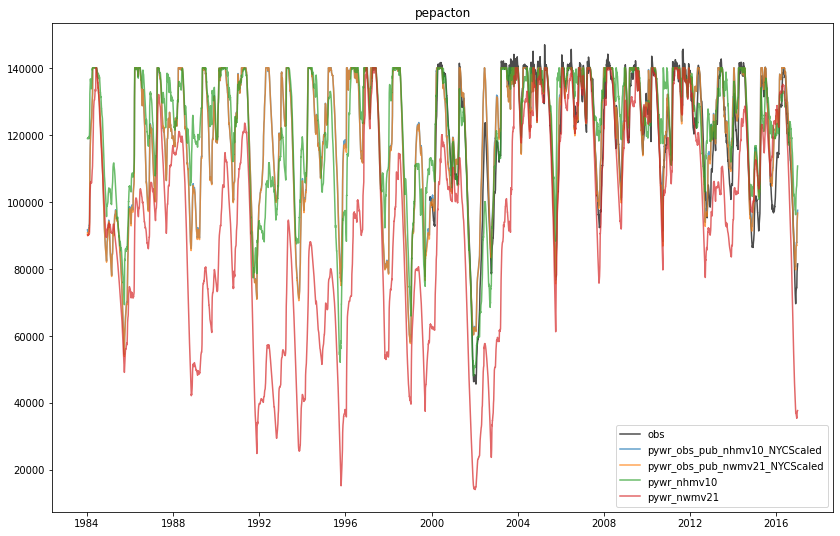

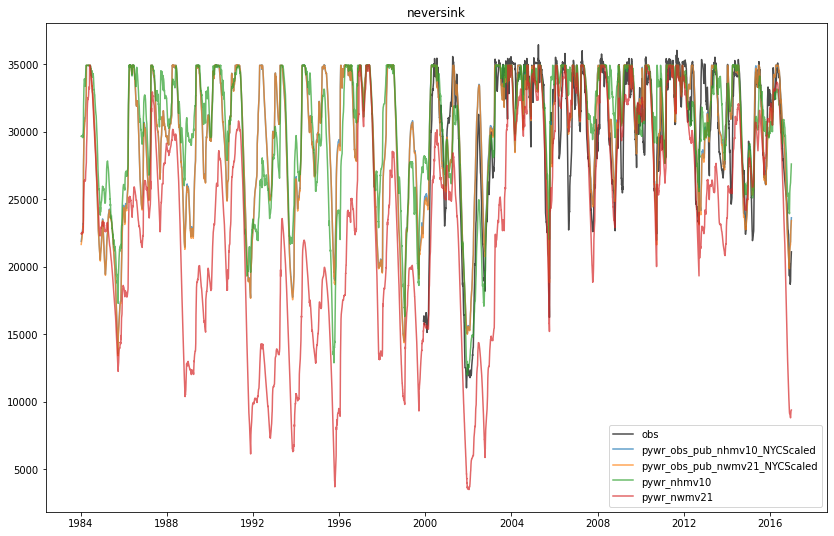

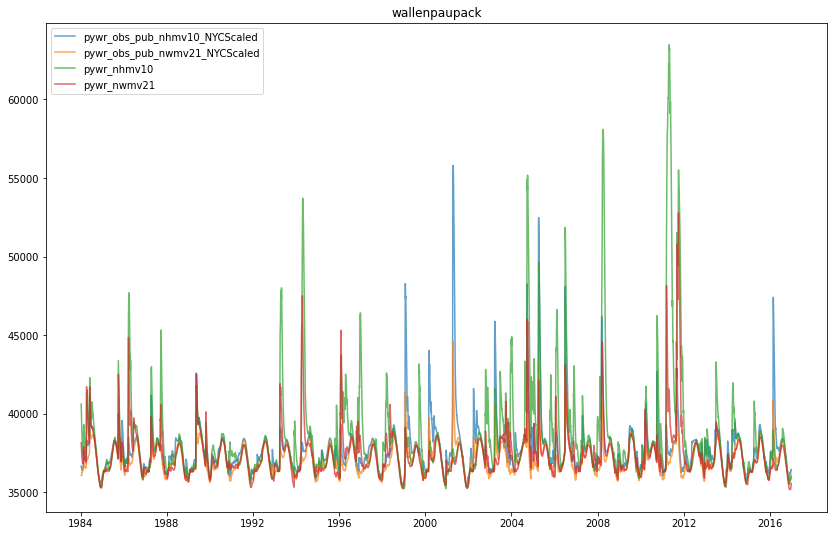

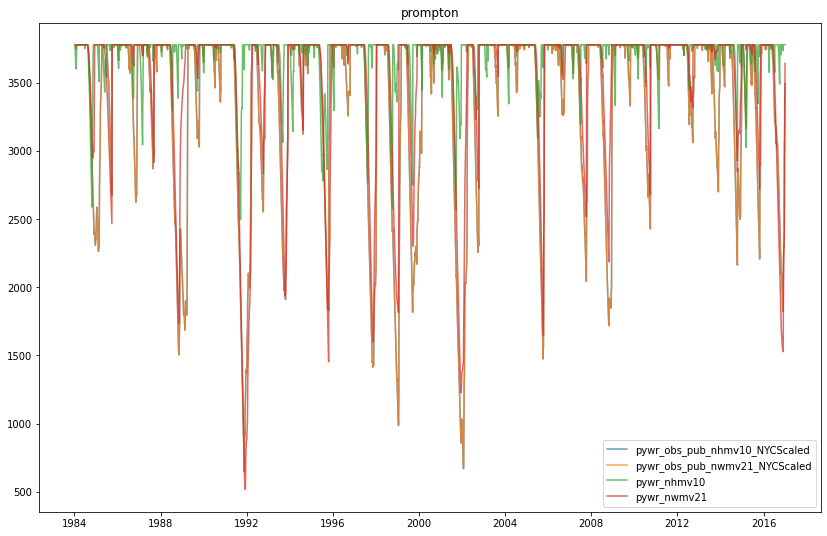

...

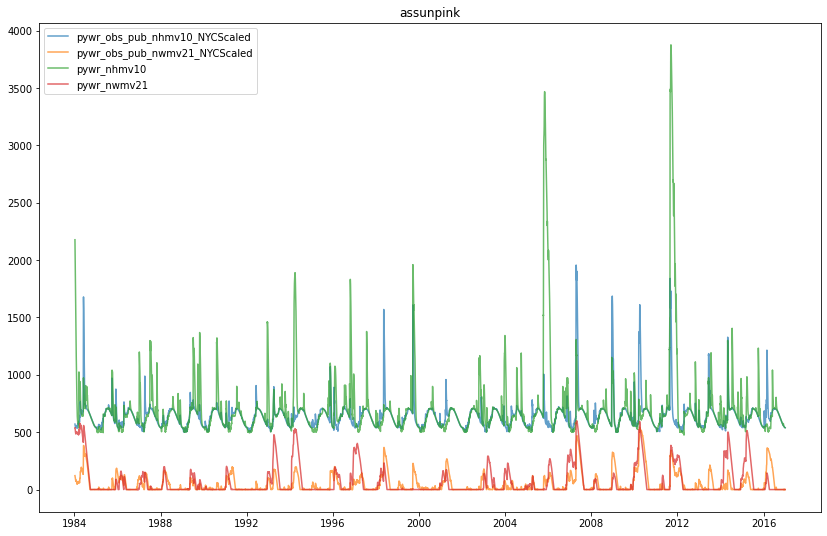

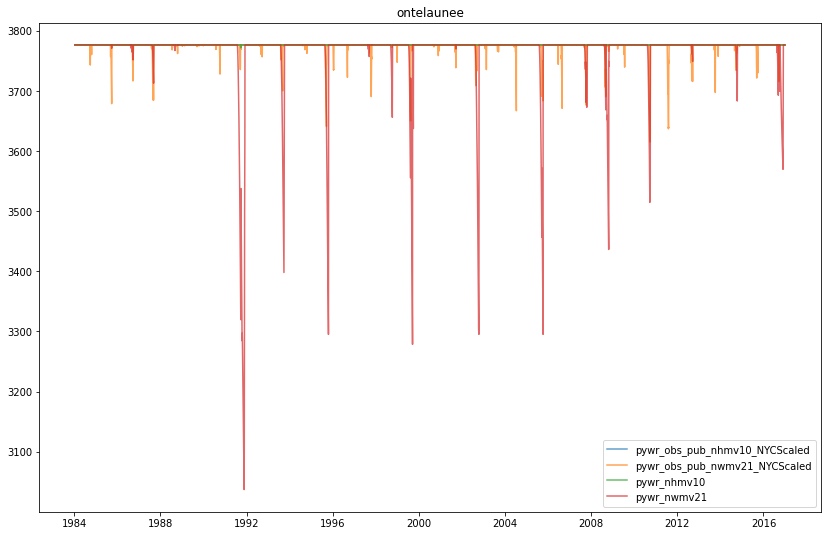

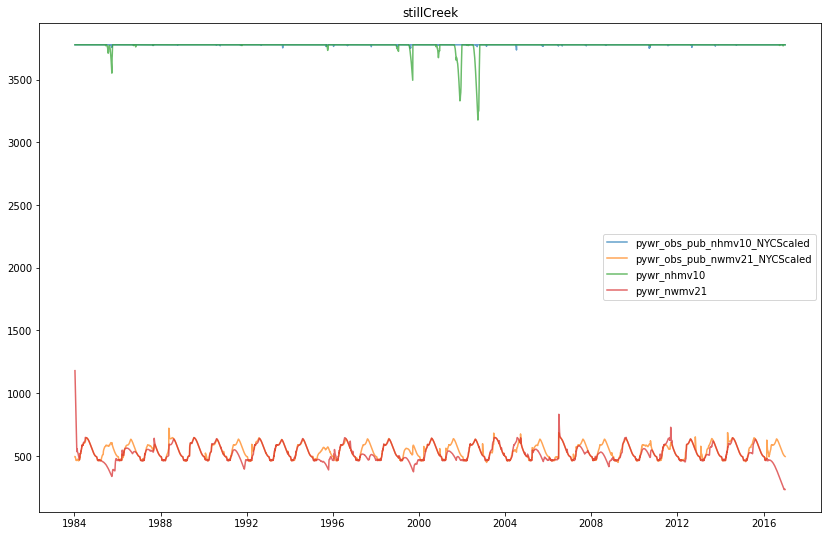

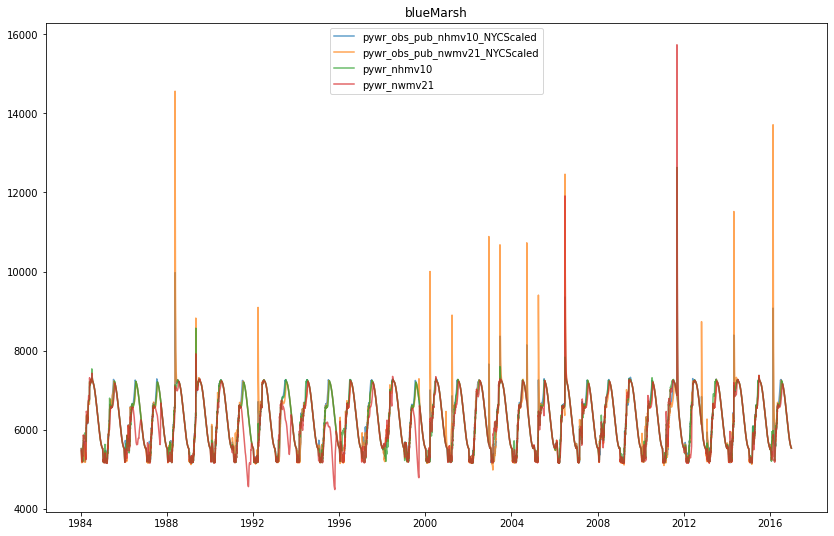

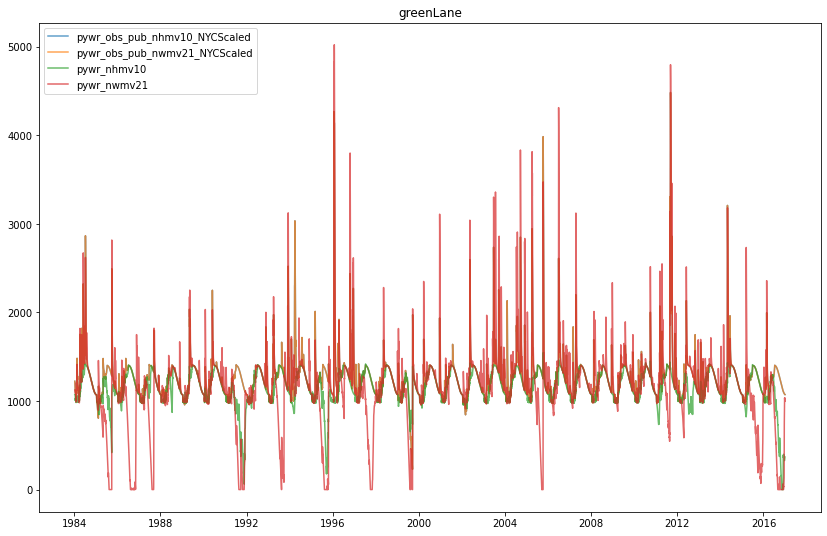

In [20]:
for reservoir in reservoir_list:
    plt.subplots(figsize=(14,9))
    if reservoir in reservoir_list_nyc:
        plt.plot(hist_storages[reservoir], color='k', label='obs', alpha=0.7)
    for model in pywr_models:
        plt.plot(res_storages[model][reservoir].iloc[100:], label=model, alpha=0.7)

    plt.legend()
    plt.title(reservoir)

/tmp/ipykernel_11147/468636728.py:2: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  start_date = pd.datetime(2001, 1,1)
/tmp/ipykernel_11147/468636728.py:3: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  end_date = pd.datetime(2004, 1,1)


Text(0, 0.5, 'Storage level')

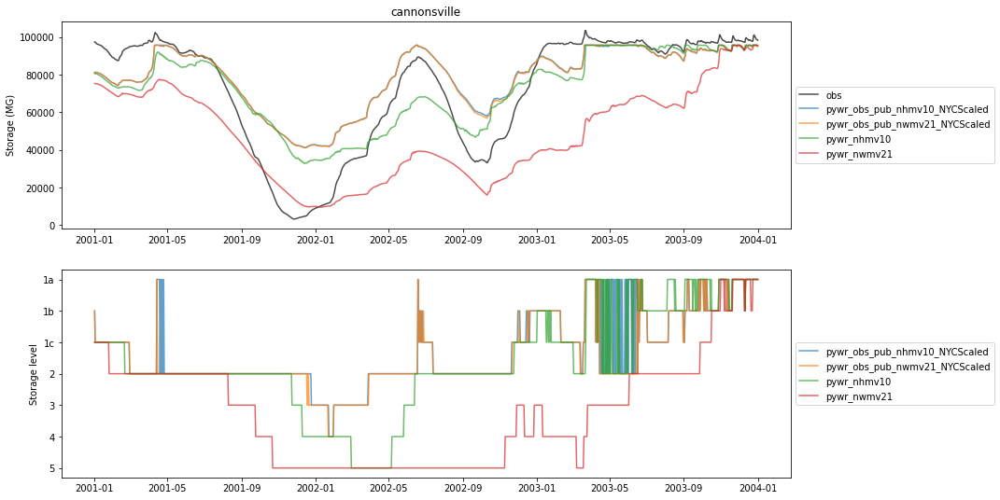

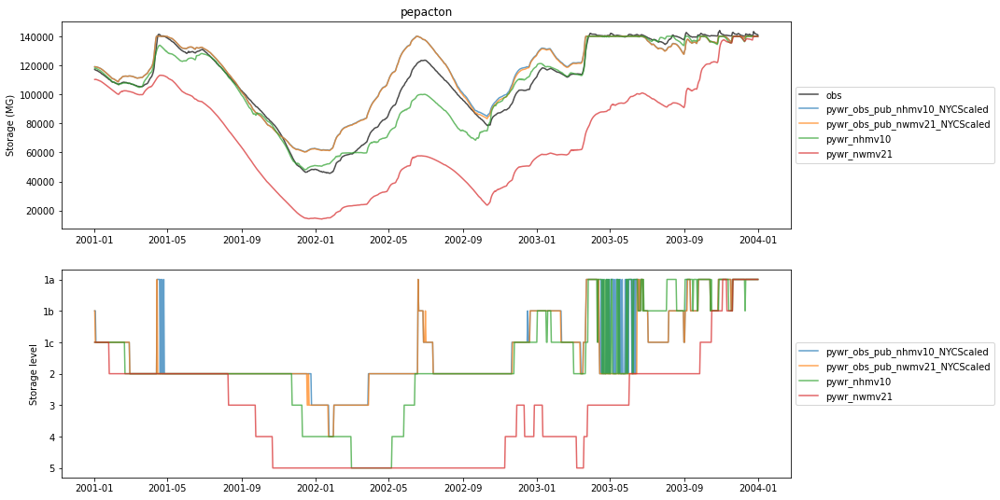

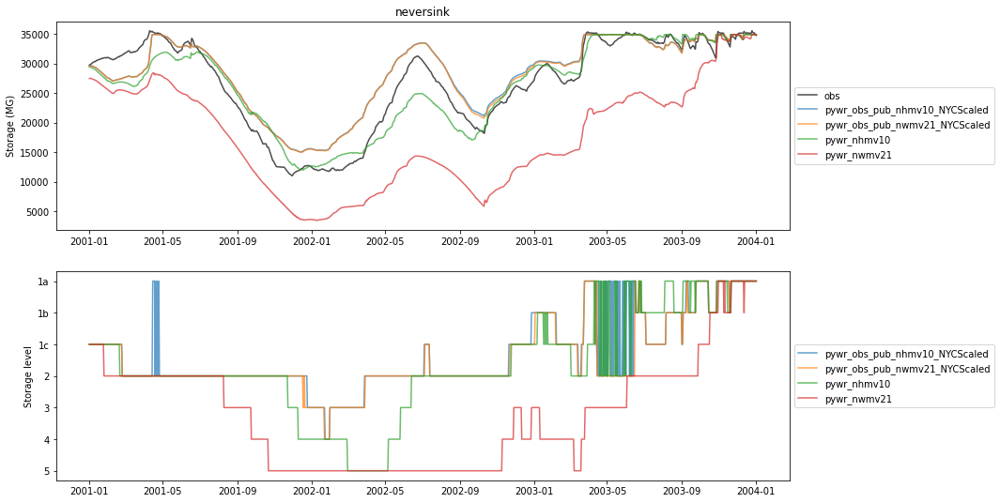

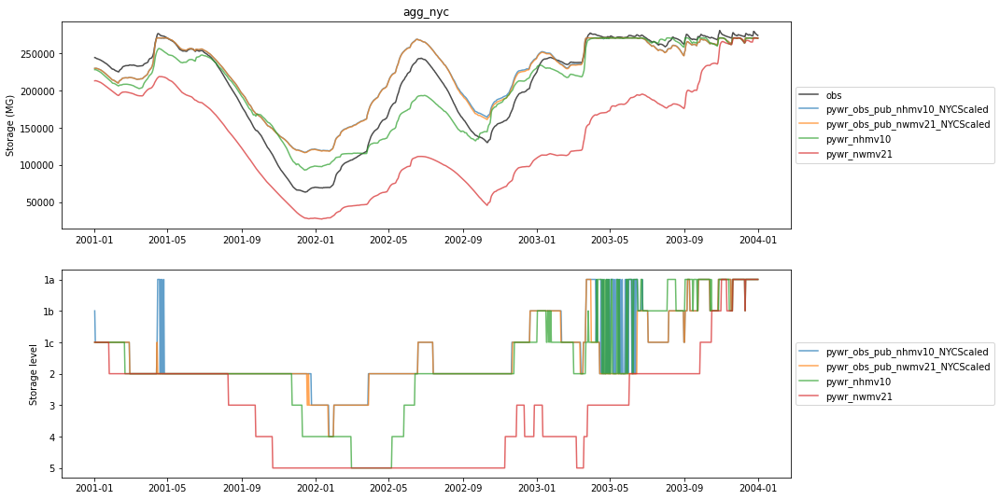

In [21]:
### zoom in on dry period 2001-2004
start_date = pd.datetime(2001, 1,1)
end_date = pd.datetime(2004, 1,1)

for reservoir in reservoir_list_nyc:
    fig, axs = plt.subplots(2,1,figsize=(14,9))
    ax = axs[0]
    ax.plot(hist_storages[reservoir].loc[start_date:end_date], color='k', label='obs', alpha=0.7)
    for model in pywr_models:
        ax.plot(res_storages[model][reservoir].loc[start_date:end_date], label=model, alpha=0.7)
    ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
    ax.set_title(reservoir)
    ax.set_ylabel('Storage (MG)')
    
    ax = axs[1]
    for model in pywr_models:
        ### use individual level when agg_nyc level is 1a-1c
        final_level = res_levels[model]['nyc'].copy()
        final_level.loc[final_level < 3] = res_levels[model][reservoir].loc[final_level < 3]
        ax.plot(-final_level.loc[start_date:end_date], label=model, alpha=0.7)
    ax.set_yticks(range(0,-7, -1), levels)
    ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
    ax.set_ylabel('Storage level')
    
### now do agg nyc
fig, axs = plt.subplots(2,1,figsize=(14,9))
ax = axs[0]
agg_storage = hist_storages['cannonsville'].loc[start_date:end_date] + hist_storages['pepacton'].loc[start_date:end_date] + hist_storages['neversink'].loc[start_date:end_date]
ax.plot(agg_storage, color='k', label='obs', alpha=0.7)
for model in pywr_models:
    agg_storage = res_storages[model]['cannonsville'].loc[start_date:end_date] + res_storages[model]['pepacton'].loc[start_date:end_date] + res_storages[model]['neversink'].loc[start_date:end_date]
    ax.plot(agg_storage, label=model, alpha=0.7)
ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
ax.set_title('agg_nyc')
ax.set_ylabel('Storage (MG)')

ax = axs[1]
for model in pywr_models:
    final_level = res_levels[model]['nyc'].copy()
    ax.plot(-final_level.loc[start_date:end_date], label=model, alpha=0.7)
ax.set_yticks(range(0,-7, -1), levels)
ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
ax.set_ylabel('Storage level')

Text(0, 0.5, 'Storage level')

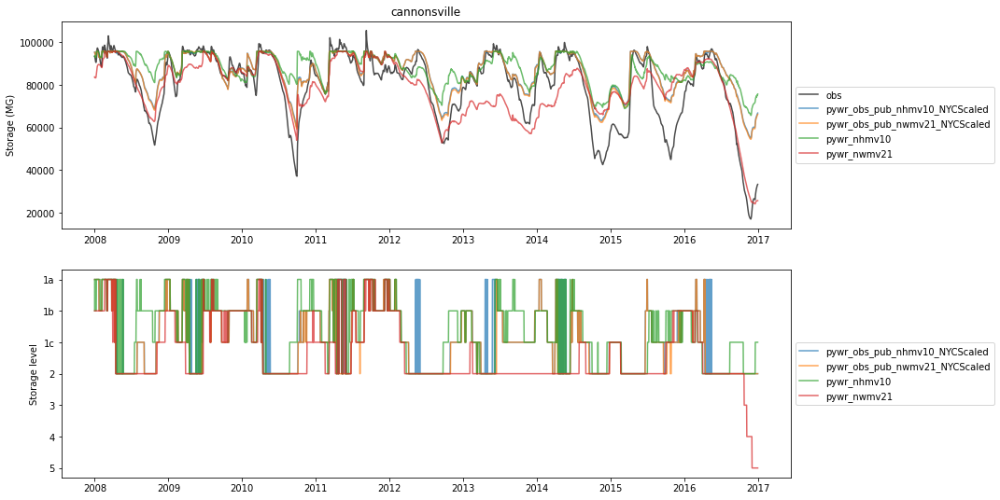

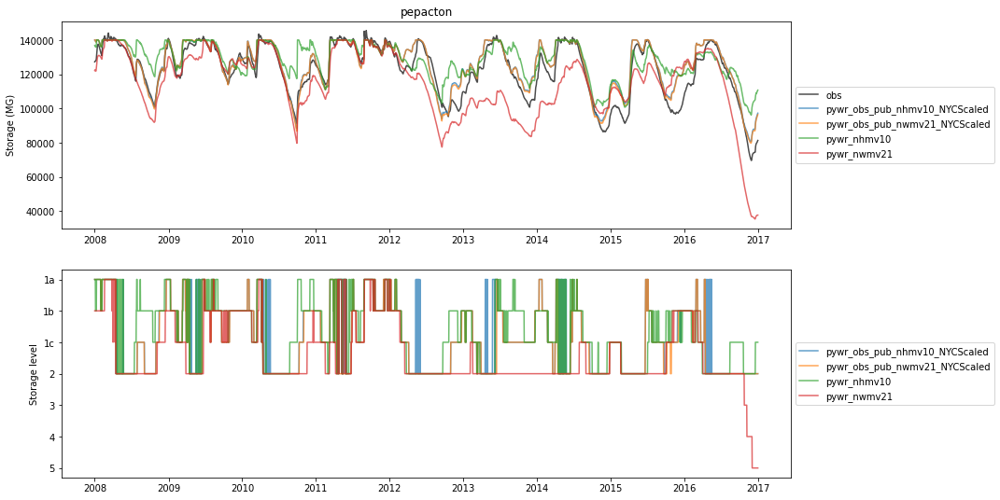

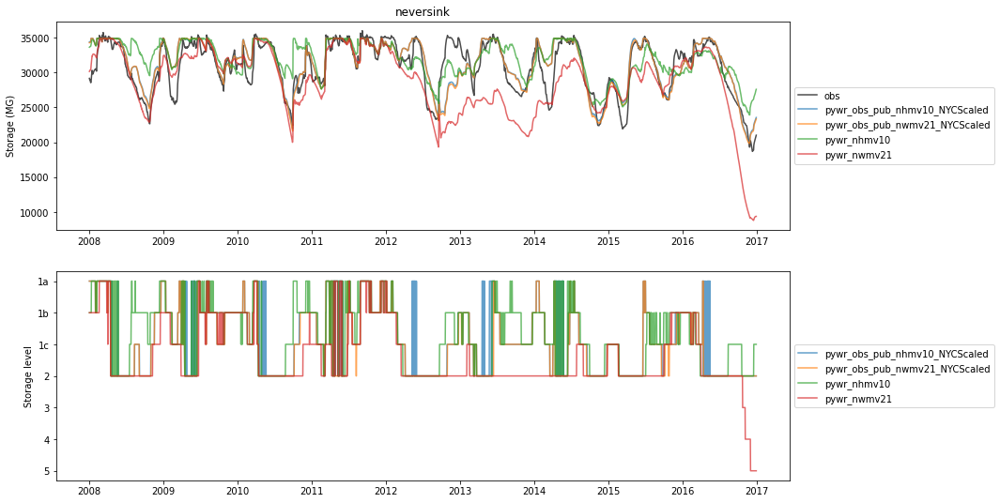

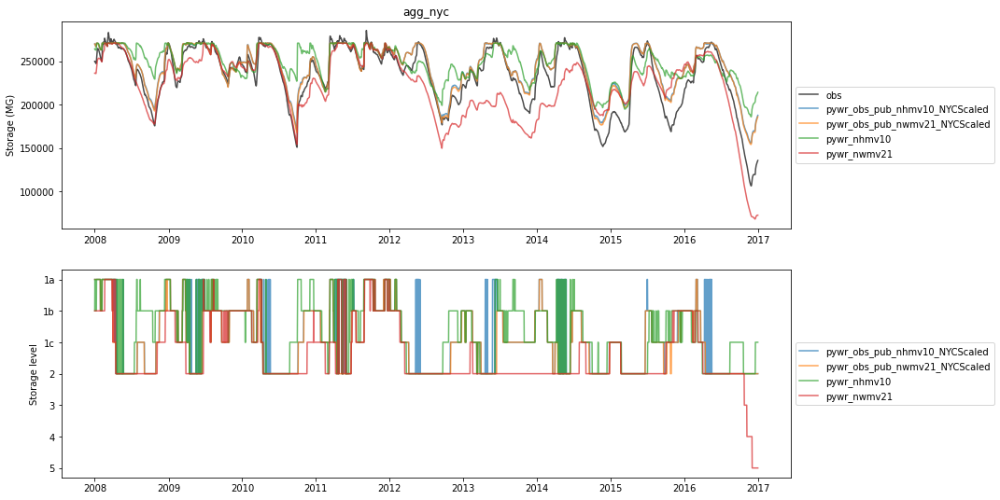

In [22]:
### zoom in on FFMP period
start_date = '2008-01-01'
end_date = '2016-12-31'

for reservoir in reservoir_list_nyc:
    fig, axs = plt.subplots(2,1,figsize=(14,9))
    ax = axs[0]
    ax.plot(hist_storages[reservoir].loc[start_date:end_date], color='k', label='obs', alpha=0.7)
    for model in pywr_models:
        ax.plot(res_storages[model][reservoir].loc[start_date:end_date], label=model, alpha=0.7)
    ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
    ax.set_title(reservoir)
    ax.set_ylabel('Storage (MG)')
    
    ax = axs[1]
    for model in pywr_models:
        ### use individual level when agg_nyc level is 1a-1c
        final_level = res_levels[model]['nyc'].copy()
        final_level.loc[final_level < 3] = res_levels[model][reservoir].loc[final_level < 3]
        ax.plot(-final_level.loc[start_date:end_date], label=model, alpha=0.7)
    ax.set_yticks(range(0,-7, -1), levels)
    ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
    ax.set_ylabel('Storage level')
    
### now do agg nyc
fig, axs = plt.subplots(2,1,figsize=(14,9))
ax = axs[0]
agg_storage = hist_storages['cannonsville'].loc[start_date:end_date] + hist_storages['pepacton'].loc[start_date:end_date] + hist_storages['neversink'].loc[start_date:end_date]
ax.plot(agg_storage, color='k', label='obs', alpha=0.7)
for model in pywr_models:
    agg_storage = res_storages[model]['cannonsville'].loc[start_date:end_date] + res_storages[model]['pepacton'].loc[start_date:end_date] + res_storages[model]['neversink'].loc[start_date:end_date]
    ax.plot(agg_storage, label=model, alpha=0.7)
ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
ax.set_title('agg_nyc')
ax.set_ylabel('Storage (MG)')

ax = axs[1]
for model in pywr_models:
    final_level = res_levels[model]['nyc'].copy()
    ax.plot(-final_level.loc[start_date:end_date], label=model, alpha=0.7)
ax.set_yticks(range(0,-7, -1), levels)
ax.legend(loc='center left', bbox_to_anchor = (1,0.5))
ax.set_ylabel('Storage level')

### analyze PUB ensemble

In [23]:
### focus on results since FFMP 2007

# start_date = '1983-10-01'
start_date = '2008-01-01'
# start_date = '2011-01-01'
# end_date = '2013-12-31'
end_date = '2016-12-31'


    
## Load data    
# Load Pywr-DRB simulation models
print('Retrieving simulation data.')
pywr_models = ['nhmv10', 'nwmv21', 'obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled']#, 'WEAP_29June2023_gridmet'

reservoir_downstream_gages = {}
major_flows = {}
datetime_index = None

for model in pywr_models:
#     print(model)
    reservoir_downstream_gages[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'reservoir_downstream_gage', datetime_index=datetime_index)
    reservoir_downstream_gages[f'pywr_{model}'] = reservoir_downstream_gages[f'pywr_{model}'].loc[start_date:end_date,:]
    
    major_flows[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'major_flow', datetime_index=datetime_index)
    major_flows[f'pywr_{model}'] = major_flows[f'pywr_{model}'].loc[start_date:end_date,:]
    
pywr_models = [f'pywr_{m}' for m in pywr_models]

### get ensemble simulation results
for member in range(1,31):
    for model in ['obs_pub_nhmv10_ObsScaled_ensemble','obs_pub_nwmv21_ObsScaled_ensemble']:
        label = f'pywr_{model}_{member}'
        pywr_models.append(label)
#         print(label)
        reservoir_downstream_gages[label], datetime_index = get_pywr_results(output_dir, model, 'reservoir_downstream_gage', 
                                                                             datetime_index=datetime_index, scenario=member-1)
        reservoir_downstream_gages[label] = reservoir_downstream_gages[label].loc[start_date:end_date,:]
    
        major_flows[label], datetime_index = get_pywr_results(output_dir, model, 'major_flow', 
                                                                             datetime_index=datetime_index, scenario=member-1)
        major_flows[label] = major_flows[label].loc[start_date:end_date,:]
        
    
# Load base (non-pywr) models
base_models = ['obs']#, 'obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled', 'nhmv10', 'nwmv21', 'WEAP_29June2023_gridmet']

datetime_index = list(reservoir_downstream_gages.values())[0].index
for model in base_models:
#     print(model)
    reservoir_downstream_gages[model], datetime_index = get_base_results(input_dir, model, datetime_index, 'reservoir_downstream_gage')
    reservoir_downstream_gages[model] = reservoir_downstream_gages[model].loc[start_date:end_date,:]
    major_flows[model], datetime_index = get_base_results(input_dir, model, datetime_index, 'major_flow')
    major_flows[model] = major_flows[model].loc[start_date:end_date,:]

    
# # Verify that all datasets have same datetime index
# for r in reservoir_downstream_gages.values():
#     assert ((r.index == datetime_index).mean() == 1)
# for r in major_flows.values():
#     assert ((r.index == datetime_index).mean() == 1)
# print(f'Successfully loaded {len(base_models)} base model results & {len(pywr_models)} pywr model results')

Retrieving simulation data.


In [24]:
major_flows

{'pywr_nhmv10':               01417000    01425000    01433500    01436000    01447800  \
 2008-01-01  548.533238  600.650095  434.578059  123.337519  553.337842   
 2008-01-02  548.059704  986.291348  336.566340  114.385711  464.341645   
 2008-01-03  547.694651  582.297198  360.845779  108.145453  419.180501   
 2008-01-04  547.401474  973.340382  253.273864  103.813712  384.907496   
 2008-01-05  386.500973  461.541934  301.469532  100.676941  370.443665   
 ...                ...         ...         ...         ...         ...   
 2016-12-27  130.080680  183.628202  160.665379   77.352753  271.477098   
 2016-12-28   48.720358  385.344023  160.433553   72.614036  220.060023   
 2016-12-29  125.862909  101.376787  157.647608   63.692602  203.266558   
 2016-12-30   48.327810  321.806583  152.829245   64.391138  193.875131   
 2016-12-31   70.755531   77.132990  148.554763   65.280978  185.475146   
 
               01449800   01463620    01470960    delDRCanal  delLordville  \
 2008

In [25]:
base_models

['obs']

In [26]:
color_dict = {'obs':'k', 'nhmv10':'r', 'nwmv21':'v', 'WEAP_29June2023':'o', 'obs_pub_nhmv10_ObsScaled': 'b', 'obs_pub_nwmv21_ObsScaled': 'g'}
for i in range(1,31):
    color_dict[f'obs_pub_nhmv10_ObsScaled_ensemble_{i}'] = 'lightblue'
    color_dict[f'obs_pub_nwmv21_ObsScaled_ensemble_{i}'] = 'lightgreen'
alpha_dict = {k: 0.8 if len(k.split('_'))<5 else 0.2 for k in color_dict.keys() }
zorder_dict = {k: 2 if len(k.split('_'))<5 else 1 for k in color_dict.keys() }



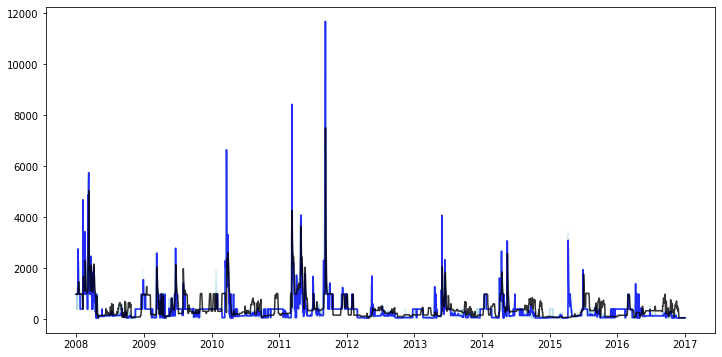

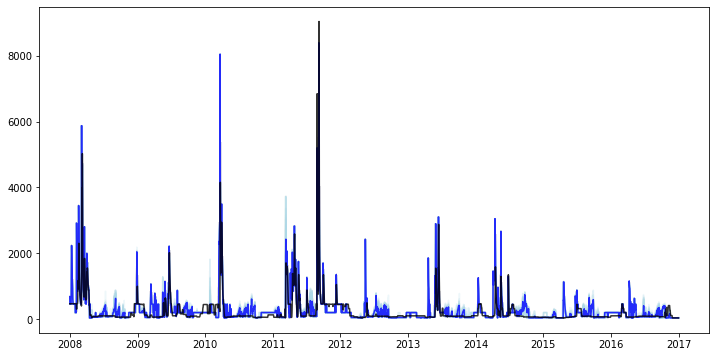

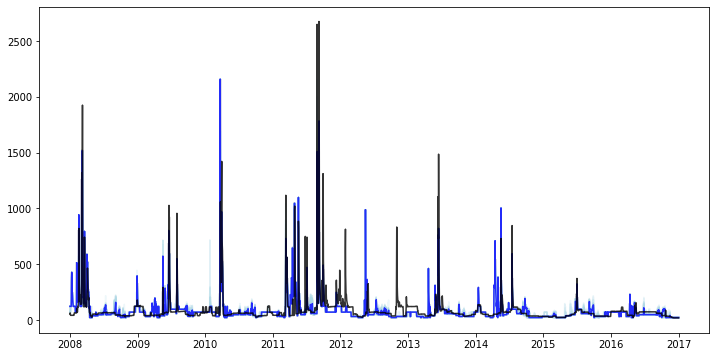

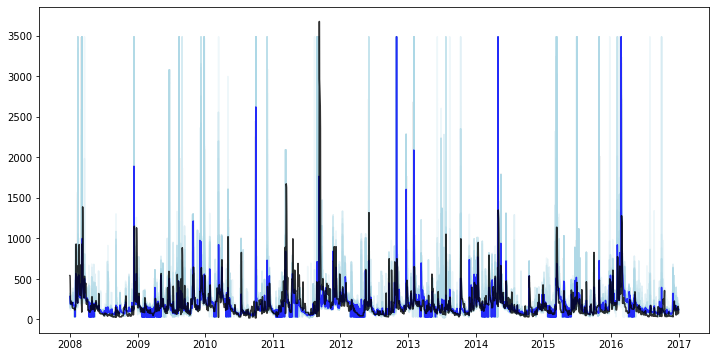

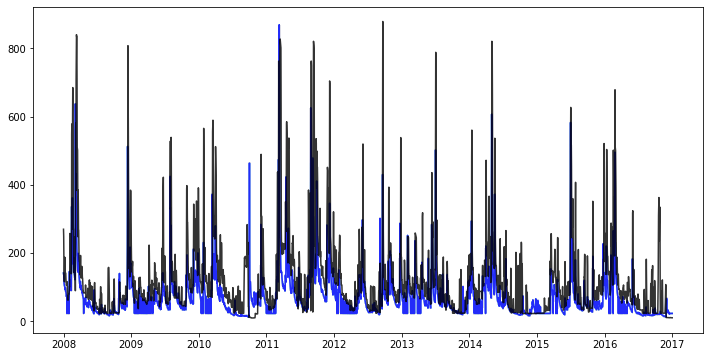

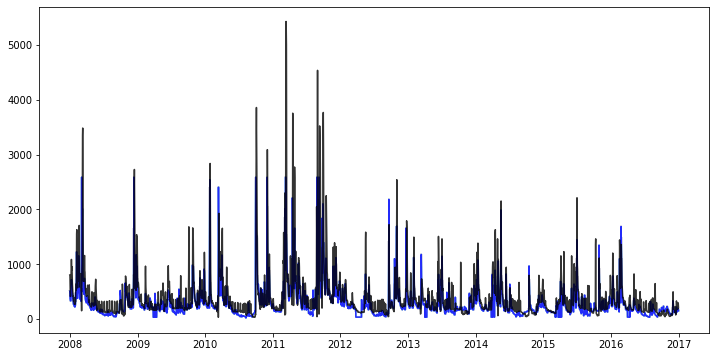

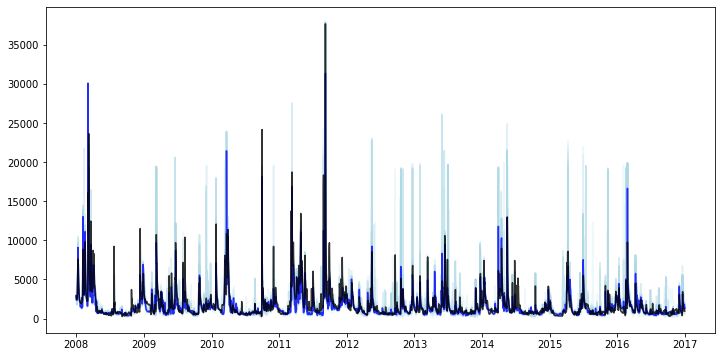

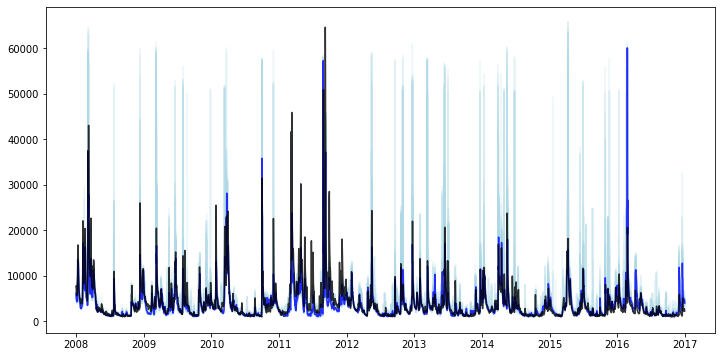

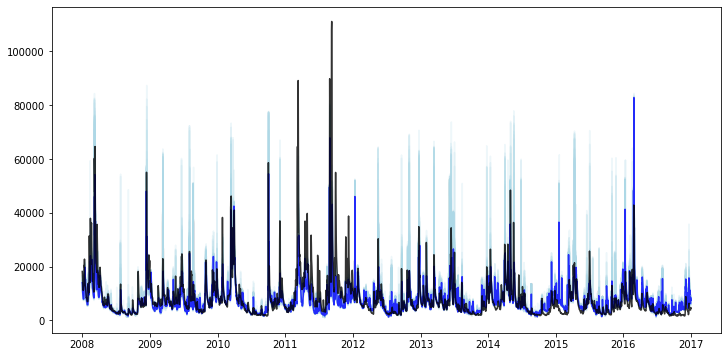

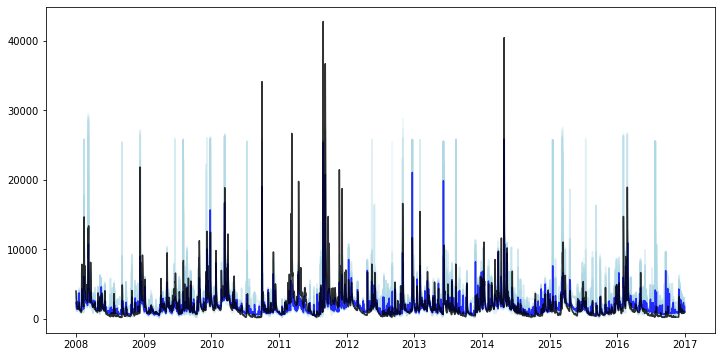

In [27]:
for reservoir in ['cannonsville','pepacton','neversink','blueMarsh','beltzvilleCombined','fewalter']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nhmv10' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(reservoir_downstream_gages[model][reservoir], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])

for major in ['delLordville','delMontague','delTrenton','outletSchuylkill']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nhmv10' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(major_flows[model][major], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])
    


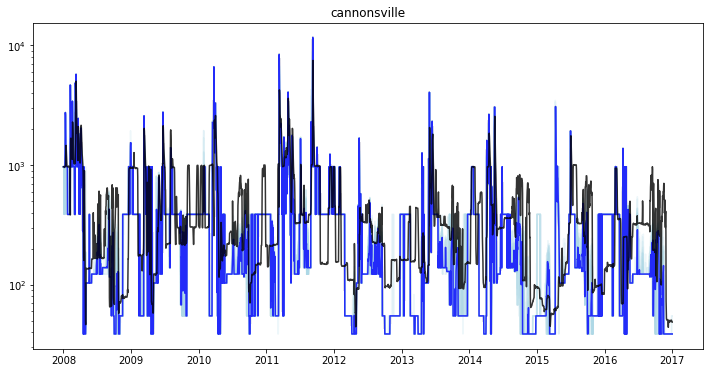

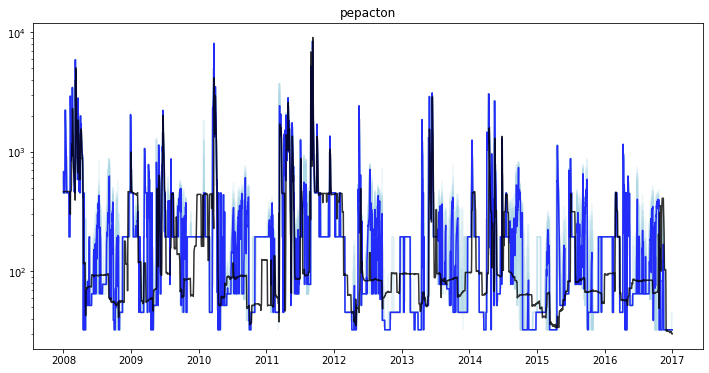

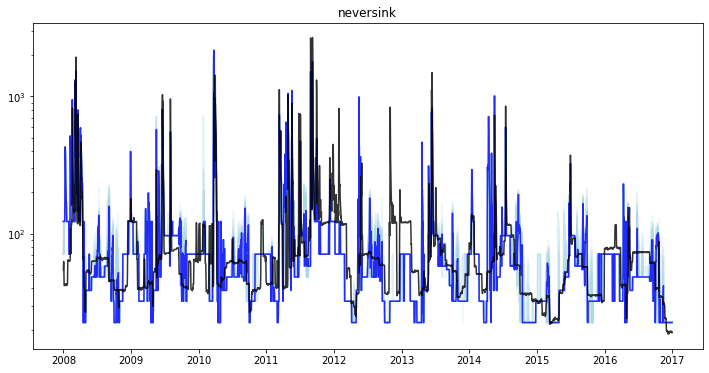

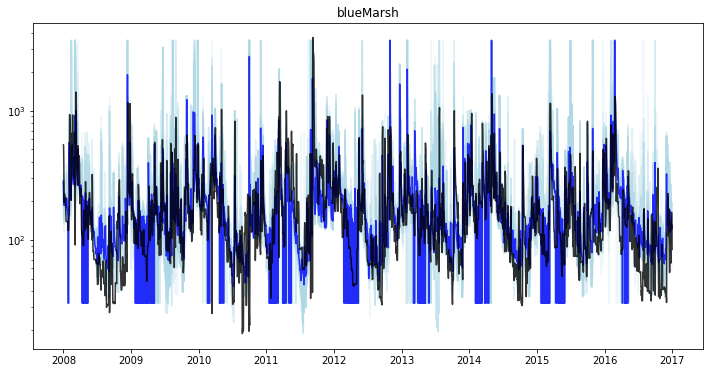

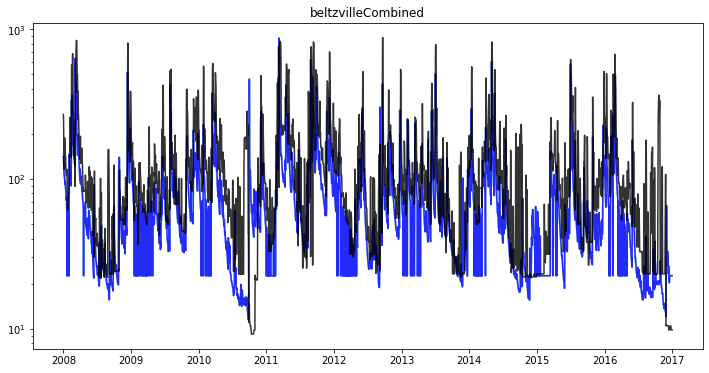

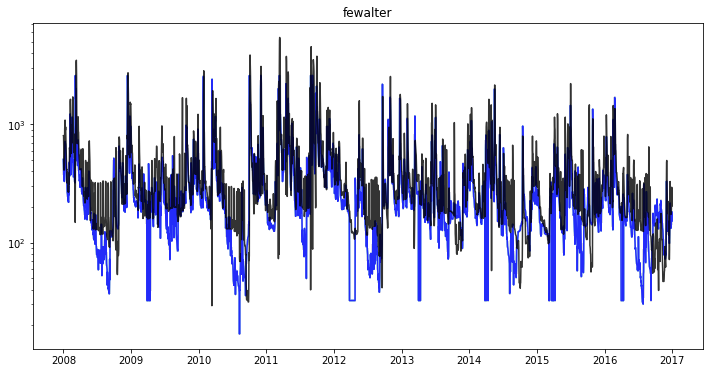

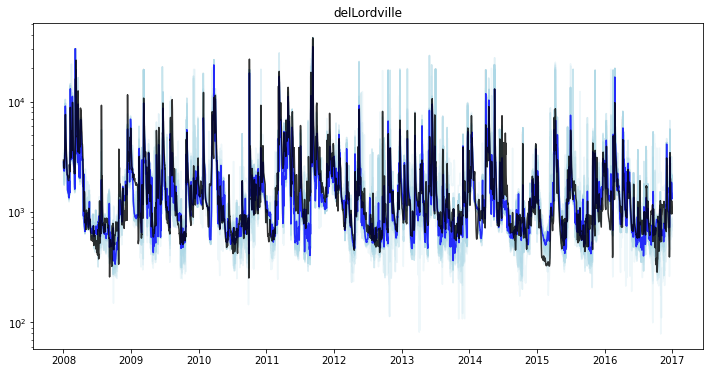

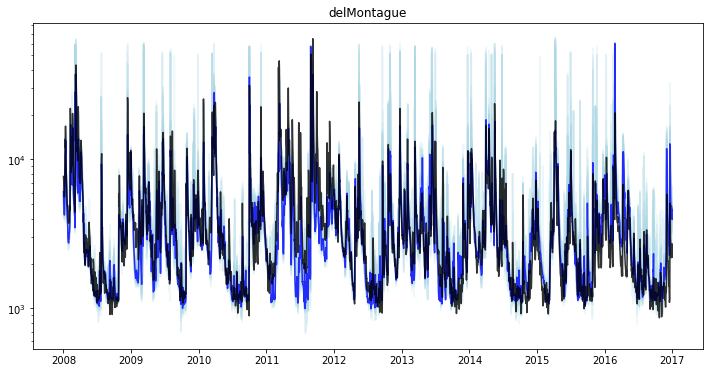

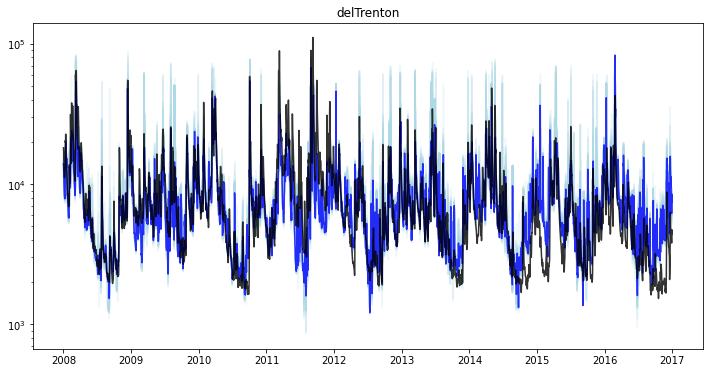

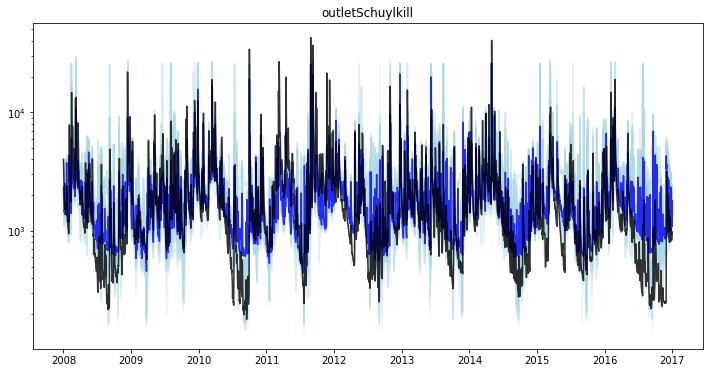

In [28]:
for reservoir in ['cannonsville','pepacton','neversink','blueMarsh','beltzvilleCombined','fewalter']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nhmv10' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(reservoir_downstream_gages[model][reservoir], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])
    plt.semilogy()
    plt.title(reservoir)
            

for major in ['delLordville','delMontague','delTrenton','outletSchuylkill']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nhmv10' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(major_flows[model][major], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])
    plt.semilogy()
    plt.title(major)
    
            


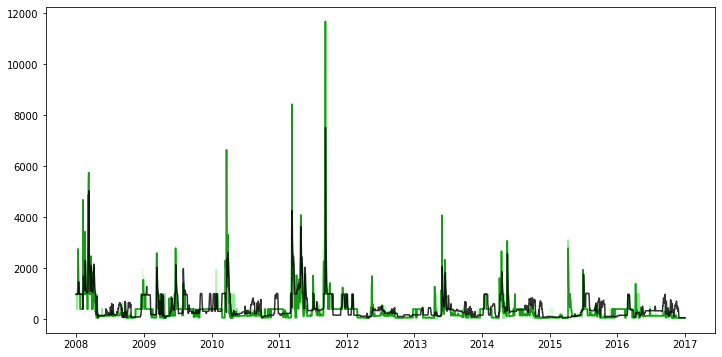

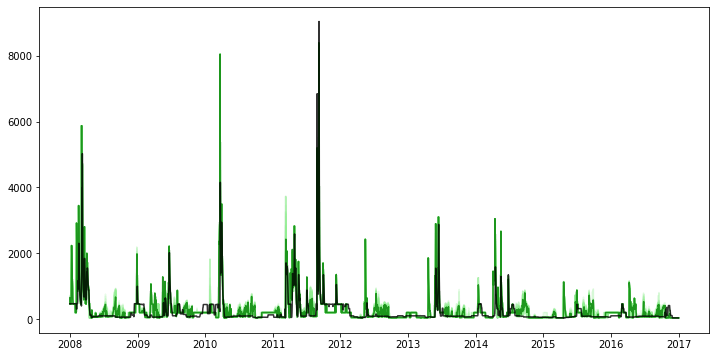

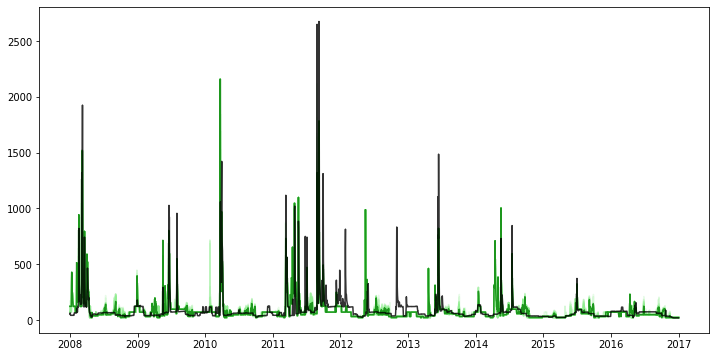

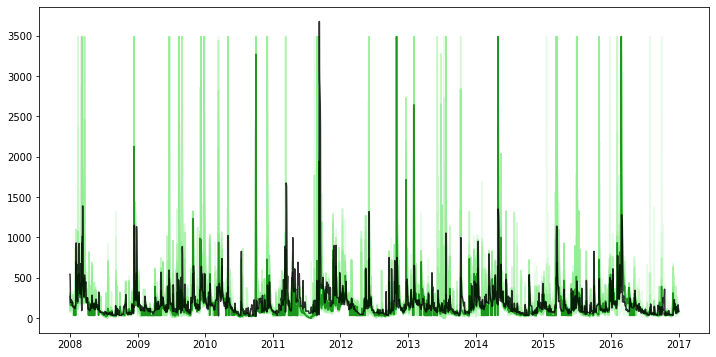

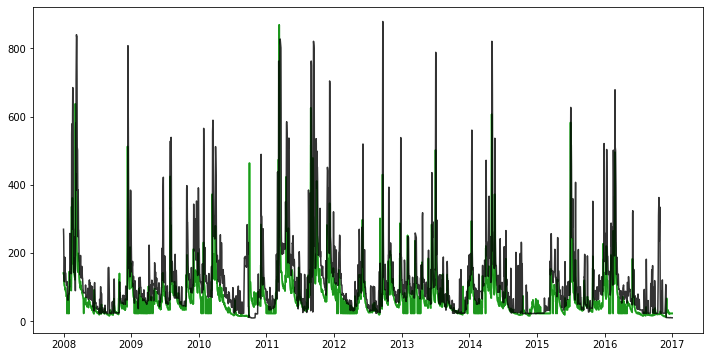

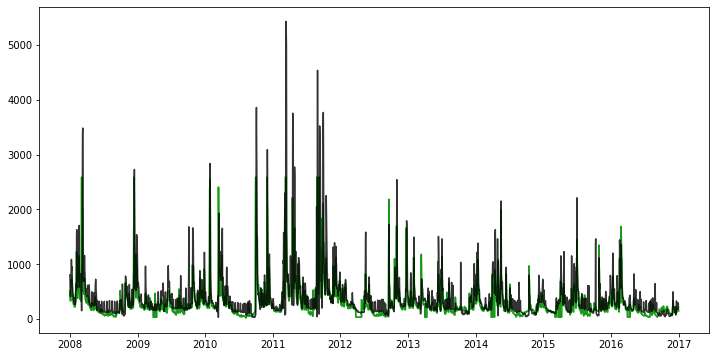

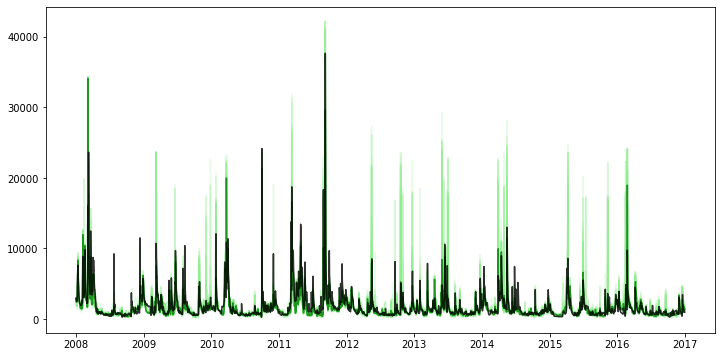

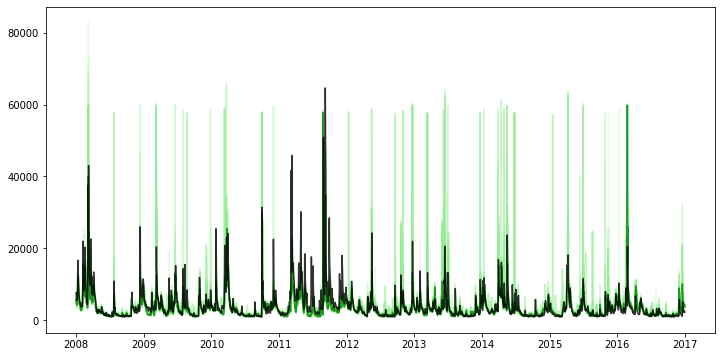

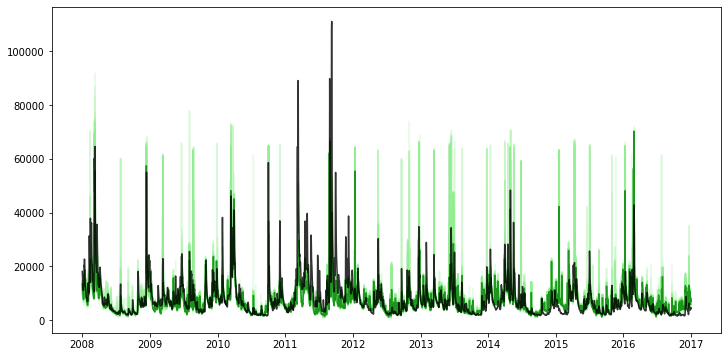

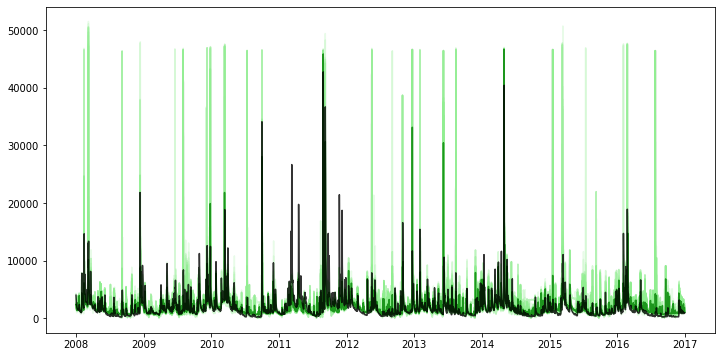

In [29]:
for reservoir in ['cannonsville','pepacton','neversink','blueMarsh','beltzvilleCombined','fewalter']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nwmv21' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(reservoir_downstream_gages[model][reservoir], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])

for major in ['delLordville','delMontague','delTrenton','outletSchuylkill']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nwmv21' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(major_flows[model][major], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])
    


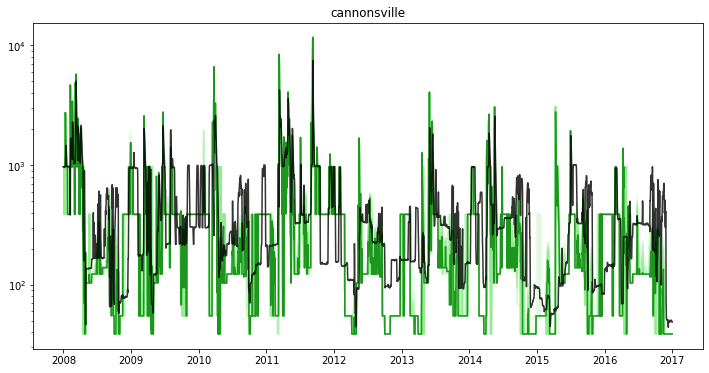

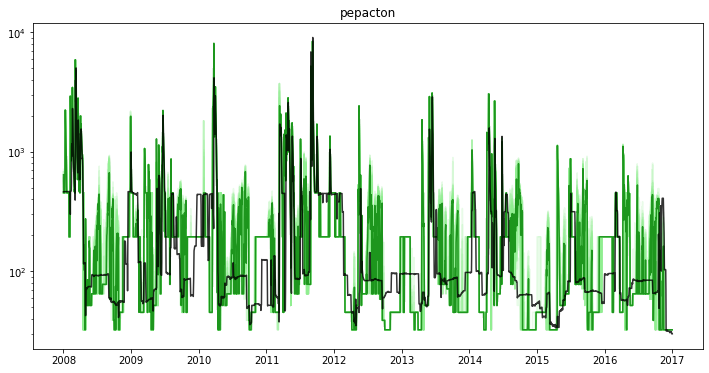

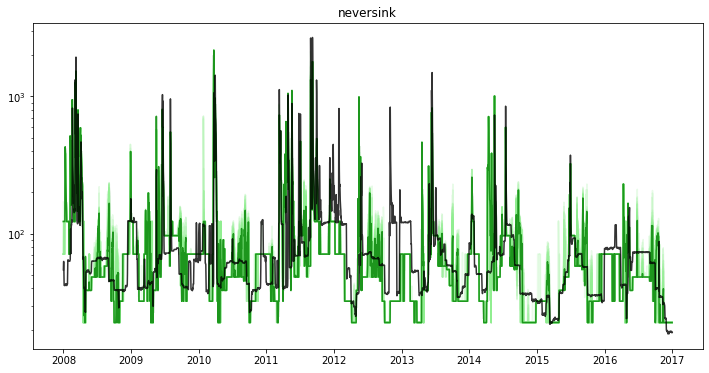

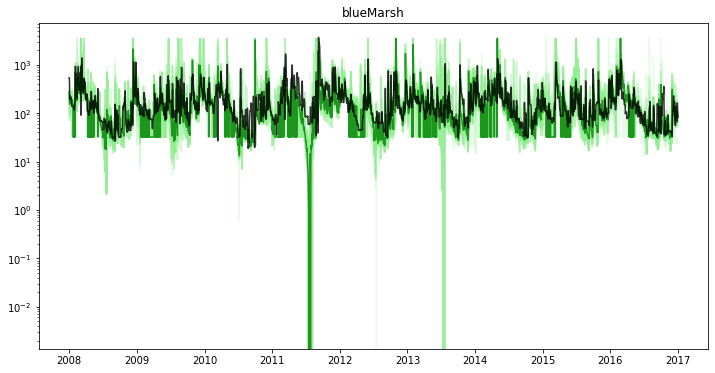

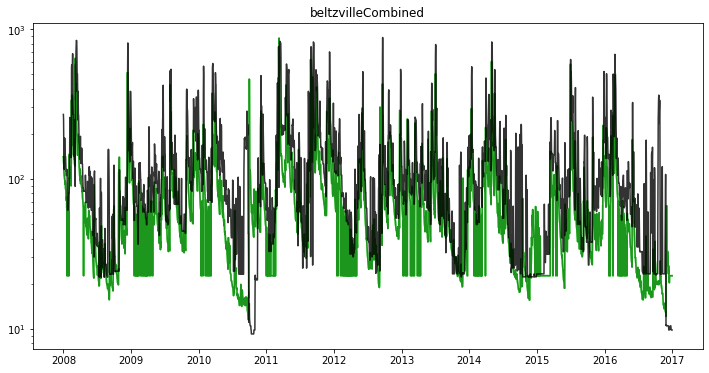

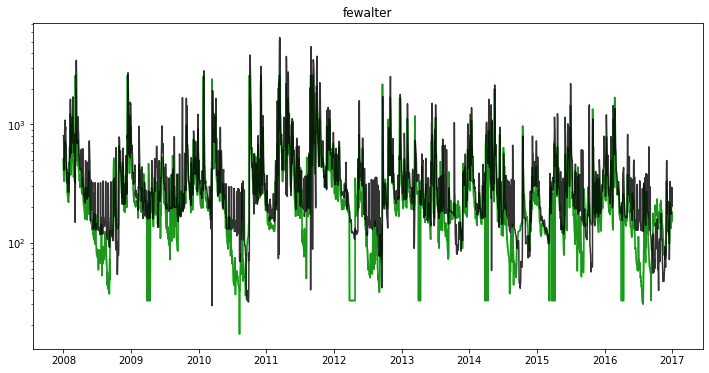

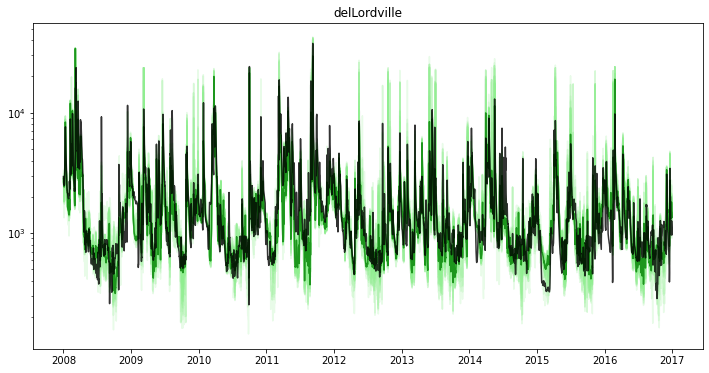

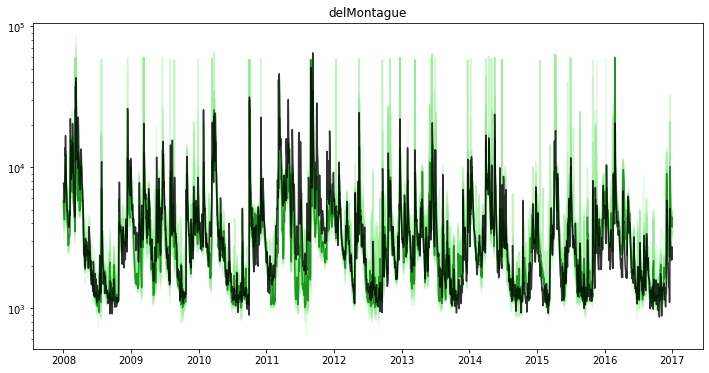

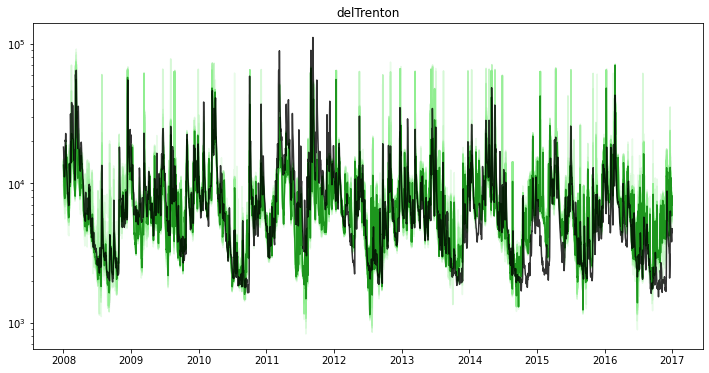

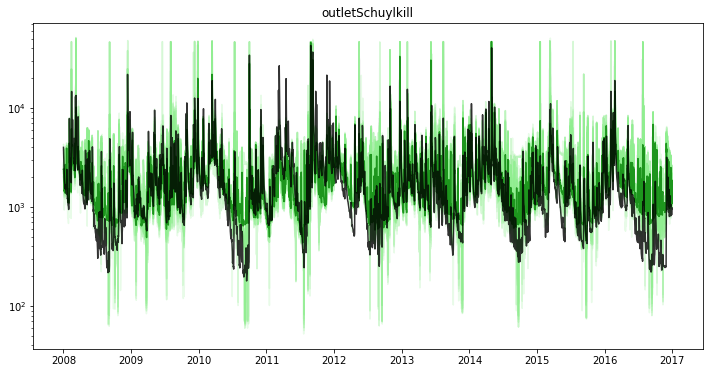

In [30]:
for reservoir in ['cannonsville','pepacton','neversink','blueMarsh','beltzvilleCombined','fewalter']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nwmv21' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(reservoir_downstream_gages[model][reservoir], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])
    plt.semilogy()
    plt.title(reservoir)
    
for major in ['delLordville','delMontague','delTrenton','outletSchuylkill']:
    plt.figure(figsize=(12,6))
    for model in pywr_models + base_models:
        if 'pywr_obs_pub_nwmv21' in model or model == 'obs':
            model_abbrev = model.split('_',1)[1] if len(model.split('_',1)) > 1 else model
            plt.plot(major_flows[model][major], color=color_dict[model_abbrev], 
                     alpha=alpha_dict[model_abbrev], zorder=zorder_dict[model_abbrev])
    plt.semilogy()
    plt.title(major)


In [ ]:
# ### look at catchment inflows from ensemble PUB to see if there are some that seem unreasonable
# with h5py.File('../input_data/historic_ensembles/catchment_inflow_obs_pub_nhmv10_ObsScaled_ensemble.hdf5') as f:
#     datetime = pd.DatetimeIndex([str(d, 'utf-8') for d in f['wallenpaupack']['date']])
#     nodes = list(f.keys())
#     for node in nodes:
#         plt.figure(figsize=(12,6))
#         df = pd.DataFrame({i: f[node][f'realization_{i}'] for i in range(1, 31)}, index = datetime)
#         datetime_plot = datetime[np.logical_and(datetime.year >= 1984, datetime.year <= 2013)]
#         df = df.loc[datetime_plot]
#         plt.plot(df, color='b', alpha=0.1)
#         try:
#             plt.plot(reservoir_downstream_gages['obs'][mode][datetime_plot], 'k')
#         except:
#             try:
#                 plt.plot(major_flows['obs'][mode][datetime_plot], 'k')
#             except:
#                 pass
                
#         plt.title(node)
#         #     for node in f.keys():
        

In [ ]:
# ### look at catchment inflows from ensemble PUB to see if there are some that seem unreasonable
# with h5py.File('../input_data/historic_ensembles/catchment_inflow_obs_pub_nhmv10_ObsScaled_ensemble.hdf5') as f:
#     datetime = pd.DatetimeIndex([str(d, 'utf-8') for d in f['wallenpaupack']['date'][-1000:]])
#     nodes = list(f.keys())
#     for node in nodes:
#         plt.figure(figsize=(12,6))
#         df = pd.DataFrame({i: f[node][f'realization_{i}'][-1000:] for i in range(1, 31)}, index = datetime)
#         plt.plot(df, color='b', alpha=0.1)
#         try:
#             plt.plot(reservoir_downstream_gages['obs'][mode][datetime], 'k')
#         except:
#             try:
#                 plt.plot(major_flows['obs'][mode][datetime], 'k')
#             except:
#                 pass
#         plt.semilogy()
#         plt.title(node)
#         #     for node in f.keys():
        

In [ ]:
# ### look at gage flows from ensemble PUB to see if there are some that seem unreasonable
# with h5py.File('../input_data/historic_ensembles/gage_flow_obs_pub_nhmv10_ObsScaled_ensemble.hdf5') as f:
#     datetime = pd.DatetimeIndex([str(d, 'utf-8') for d in f['wallenpaupack']['date'][-1000:]])
#     nodes = list(f.keys())
#     for node in nodes:
#         plt.figure(figsize=(12,6))
#         df = pd.DataFrame({i: f[node][f'realization_{i}'][-1000:] for i in range(1, 31)}, index = datetime)
#         plt.plot(df, color='b', alpha=0.1)
#         try:
#             plt.plot(reservoir_downstream_gages['obs'][mode][datetime], 'k')
#         except:
#             try:
#                 plt.plot(major_flows['obs'][mode][datetime], 'k')
#             except:
#                 pass
#         plt.semilogy()
#         plt.title(node)
#         #     for node in f.keys():
        

In [ ]:
# ### look at original flows straight from historic reconstruction
# with h5py.File('../input_data/historic_ensembles/historic_reconstruction_daily_nhmv10_ensemble_mgd.hdf5') as f:
#     datetime = pd.DatetimeIndex([str(d, 'utf-8') for d in f['realization_1/date'][-1000:]])
#     nodes = list(f['realization_1'].keys())
#     for node in nodes:
#         plt.figure(figsize=(12,6))
#         df = pd.DataFrame({i: f[f'realization_{i}'][node][-1000:] for i in range(1, 31)}, index = datetime)#
#         for i in df.columns:
#             plt.plot(df[i], color='b', alpha=0.1)
# #         try:
# #             plt.plot(reservoir_downstream_gages['obs'][mode][datetime], 'k')
# #         except:
# #             try:
# #                 plt.plot(major_flows['obs'][mode][datetime], 'k')
# #             except:
# #                 pass
#         plt.semilogy()
#         plt.title(node)
        

### compare monthly distributions of different datasets

In [31]:
# start_date = '1983-10-01'
start_date = '2008-01-01'
end_date = '2016-12-31'

    
# Load data    
# Load Pywr-DRB simulation models
print('Retrieving simulation data.')
pywr_models = ['nhmv10', 'nwmv21', 'obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled']#,,  'WEAP_29June2023_gridmet']

reservoir_downstream_gages = {}
major_flows = {}
datetime_index = None

for model in pywr_models:
    print(model)
#     reservoir_downstream_gages[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'reservoir_downstream_gage', datetime_index=datetime_index)
#     reservoir_downstream_gages[f'pywr_{model}'] = reservoir_downstream_gages[f'pywr_{model}'].loc[start_date:end_date,:]
    
    major_flows[f'pywr_{model}'], datetime_index = get_pywr_results(output_dir, model, 'major_flow', datetime_index=datetime_index)
    major_flows[f'pywr_{model}'] = major_flows[f'pywr_{model}'].loc[start_date:end_date,:]
pywr_models = [f'pywr_{m}' for m in pywr_models]

# Load base (non-pywr) models
base_models = ['obs', 'obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled', 'nhmv10', 'nwmv21']#, 'WEAP_29June2023_gridmet'

datetime_index = list(major_flows.values())[0].index
for model in base_models:
    print(model)
#     reservoir_downstream_gages[model] = get_base_results(input_dir, model, datetime_index, 'reservoir_downstream_gage').loc[start_date:end_date,:]
    major_flows[model], datetime_index = get_base_results(input_dir, model, datetime_index, 'major_flow')
    major_flows[model] = major_flows[model].loc[start_date:end_date,:]

# Verify that all datasets have same datetime index
for r in major_flows.values():
    assert ((r.index == datetime_index).mean() == 1)
for r in major_flows.values():
    assert ((r.index == datetime_index).mean() == 1)



### get ensemble simulation results
for member in range(1,31):
    for model in ['obs_pub_nhmv10_ObsScaled_ensemble','obs_pub_nwmv21_ObsScaled_ensemble']:
        label = f'{model}_{member}'
        print(label)
        major_flows[label], datetime_index = get_base_results(input_dir + '/historic_ensembles/', model, 
                                                              datetime_index=datetime_index, ensemble_scenario=member)
        major_flows[label] = major_flows[label].loc[start_date:end_date,:]

for member in range(1,31):
    for model in ['obs_pub_nhmv10_ObsScaled_ensemble','obs_pub_nwmv21_ObsScaled_ensemble']:
        label = f'pywr_{model}_{member}'
        pywr_models.append(label)
        print(label)
#         reservoir_downstream_gages[label], datetime_index = get_pywr_results(output_dir, model, 'reservoir_downstream_gage', 
#                                                                              datetime_index=datetime_index, scenario=member-1)
#         reservoir_downstream_gages[label] = reservoir_downstream_gages[label].loc[start_date:end_date,:]
    
        major_flows[label], datetime_index = get_pywr_results(output_dir, model, 'major_flow', 
                                                                             datetime_index=datetime_index, scenario=member-1)
        major_flows[label] = major_flows[label].loc[start_date:end_date,:]

### get ensemble averages
for model in ['obs_pub_nhmv10_ObsScaled_ensemble','obs_pub_nwmv21_ObsScaled_ensemble']:
    label = f'{model}_mean'
    print(label)
    major_flows[label] = major_flows[f'{model}_1'].copy()
    for col in major_flows[label].columns:
        for member in range(2, 31):
            major_flows[label][col] = major_flows[label][col] + major_flows[f'{model}_{member}'][col]
        major_flows[label][col] /= 30
        
    label = f'pywr_{model}_mean'
    pywr_models.append(label)
    print(label)
    major_flows[label] = major_flows[f'pywr_{model}_1'].copy()
    for col in major_flows[label].columns:
        for member in range(2, 31):
            major_flows[label][col] = major_flows[label][col] + major_flows[f'pywr_{model}_{member}'][col]
        major_flows[label][col] /= 30
        
print(f'Successfully loaded {len(base_models)} base model results & {len(pywr_models)} pywr model results')
        
base_models = ['obs','nhmv10','nwmv21','obs_pub_nhmv10_ObsScaled','obs_pub_nwmv21_ObsScaled','obs_pub_nhmv10_ObsScaled_ensemble_mean','obs_pub_nwmv21_ObsScaled_ensemble_mean']#,'WEAP_29June2023_gridmet'
pywr_models = ['obs'] + pywr_models #,'pywr_nhmv10','pywr_nwmv21','pywr_obs_pub_nhmv10_ObsScaled','pywr_obs_pub_nwmv21_ObsScaled']#,'WEAP_29June2023_gridmet'


Retrieving simulation data.
nhmv10
nwmv21
obs_pub_nhmv10_NYCScaled
obs_pub_nwmv21_NYCScaled
obs
obs_pub_nhmv10_NYCScaled
obs_pub_nwmv21_NYCScaled
nhmv10
nwmv21
obs_pub_nhmv10_NYCScaled_ensemble_1
obs_pub_nwmv21_NYCScaled_ensemble_1
obs_pub_nhmv10_NYCScaled_ensemble_2
obs_pub_nwmv21_NYCScaled_ensemble_2
obs_pub_nhmv10_NYCScaled_ensemble_3
obs_pub_nwmv21_NYCScaled_ensemble_3
obs_pub_nhmv10_NYCScaled_ensemble_4
obs_pub_nwmv21_NYCScaled_ensemble_4
obs_pub_nhmv10_NYCScaled_ensemble_5
obs_pub_nwmv21_NYCScaled_ensemble_5
obs_pub_nhmv10_NYCScaled_ensemble_6
obs_pub_nwmv21_NYCScaled_ensemble_6
obs_pub_nhmv10_NYCScaled_ensemble_7
obs_pub_nwmv21_NYCScaled_ensemble_7
obs_pub_nhmv10_NYCScaled_ensemble_8
obs_pub_nwmv21_NYCScaled_ensemble_8
obs_pub_nhmv10_NYCScaled_ensemble_9
obs_pub_nwmv21_NYCScaled_ensemble_9
obs_pub_nhmv10_NYCScaled_ensemble_10
obs_pub_nwmv21_NYCScaled_ensemble_10
obs_pub_nhmv10_NYCScaled_ensemble_11
obs_pub_nwmv21_NYCScaled_ensemble_11
obs_pub_nhmv10_NYCScaled_ensemble_12
obs_pub

KeyError: "Unable to open object (object 'realization_30' doesn't exist)"

In [ ]:

cmap_dict = {'obs':None, 'nhmv10':cm.get_cmap('Blues'), 'nwmv21':cm.get_cmap('Greens'), #'WEAP_29June2023_gridmet':'purple', 
                         'obs_pub_nhmv10_ObsScaled':cm.get_cmap('Oranges'), 'obs_pub_nwmv21_ObsScaled':cm.get_cmap('Reds'),
                         'pywr_nhmv10':cm.get_cmap('Blues'), 'pywr_nwmv21':cm.get_cmap('Greens'), #'pywr_WEAP_29June2023_gridmet':'purple', 
                         'pywr_obs_pub_nhmv10_ObsScaled':cm.get_cmap('Oranges'), 'pywr_obs_pub_nwmv21_ObsScaled':cm.get_cmap('Reds')}
for member in list(range(1,31)) + ['mean']:
    cmap_dict[f'obs_pub_nhmv10_ObsScaled_ensemble_{member}'] = cm.get_cmap('Purples')
    cmap_dict[f'obs_pub_nwmv21_ObsScaled_ensemble_{member}'] = cm.get_cmap('YlOrBr')
    cmap_dict[f'pywr_obs_pub_nhmv10_ObsScaled_ensemble_{member}'] = cm.get_cmap('Purples')
    cmap_dict[f'pywr_obs_pub_nwmv21_ObsScaled_ensemble_{member}'] = cm.get_cmap('YlOrBr')
    
cmap_boxes = {k: cmap_dict[k](0.3) if k != 'obs' else '0.7' for k in cmap_dict}
cmap_lines = {k: cmap_dict[k](0.9) if k != 'obs' else '0.1' for k in cmap_dict}
month_dict = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}

In [ ]:
### monthly boxplots for raw input dataset modeled flows
for nodes in [['01425000'],['01425000','01417000','01436000'],['delTrenton']]:
    fig, ax = plt.subplots(1,1,figsize=(12,6))
    xpartitions = []
    for i, model in enumerate(base_models):
        # model = 'obs'
        flow = major_flows[model][nodes].sum(axis=1)
        flow_monthly_q01 = flow.groupby(flow.index.month).apply(np.quantile, 0.01)
        flow_monthly_q25 = flow.groupby(flow.index.month).apply(np.quantile, 0.25)
        flow_monthly_q50 = flow.groupby(flow.index.month).apply(np.quantile, 0.50)
        flow_monthly_q75 = flow.groupby(flow.index.month).apply(np.quantile, 0.75)
        flow_monthly_q99 = flow.groupby(flow.index.month).apply(np.quantile, 0.99)

        for m in range(1,13):
            dx = 0.08
            mx = m + (dx + 0.05) * i
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q50[m], flow_monthly_q50[m]), color=cmap_lines[model], zorder=2)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q99[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q01[m], flow_monthly_q01[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+dx/2, mx+dx/2), (flow_monthly_q01[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            box = [Rectangle((mx,flow_monthly_q25[m]),dx,flow_monthly_q75[m] - flow_monthly_q25[m])]
            pc = PatchCollection(box, facecolor = cmap_boxes[model], edgecolor=cmap_lines[model], lw=0.5, zorder=1)
            ax.add_collection(pc)
            if i == len(base_models)-1:
                if m == 1:
                    xpartitions.append(mx+dx + (m+1-mx-dx)/2 - 1)
                xpartitions.append(mx+dx + (m+1-mx-dx)/2)
    for m in range(1,13):
        plt.axvline(xpartitions[m], color='k', lw=0.5)
    plt.xlim(xpartitions[0], xpartitions[-1])     
    plt.xticks([(xpartitions[m] - 0.5) for m in range(1,13)], [month_dict[m] for m in range(1,13)])
            
    plt.semilogy()
    plt.ylabel('Streamflow (MGD)')
    plt.title(nodes)


In [ ]:
### monthly boxplots for pywr-modeled flows
pywr_models_nonensemble = pywr_models[:5]+pywr_models[-2:]
for nodes in [['01425000'],['01425000','01417000','01436000'],['delTrenton']]:
    fig, ax = plt.subplots(1,1,figsize=(12,6))
    xpartitions = []
    for i, model in enumerate(pywr_models_nonensemble):
        print(model)
        # model = 'obs'
        flow = major_flows[model][nodes].sum(axis=1)
        flow_monthly_q01 = flow.groupby(flow.index.month).apply(np.quantile, 0.01)
        flow_monthly_q25 = flow.groupby(flow.index.month).apply(np.quantile, 0.25)
        flow_monthly_q50 = flow.groupby(flow.index.month).apply(np.quantile, 0.50)
        flow_monthly_q75 = flow.groupby(flow.index.month).apply(np.quantile, 0.75)
        flow_monthly_q99 = flow.groupby(flow.index.month).apply(np.quantile, 0.99)

        for m in range(1,13):
            dx = 0.08
            mx = m + (dx + 0.05) * i
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q50[m], flow_monthly_q50[m]), color=cmap_lines[model], zorder=2)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q99[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q01[m], flow_monthly_q01[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+dx/2, mx+dx/2), (flow_monthly_q01[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            box = [Rectangle((mx,flow_monthly_q25[m]),dx,flow_monthly_q75[m] - flow_monthly_q25[m])]
            pc = PatchCollection(box, facecolor = cmap_boxes[model], edgecolor=cmap_lines[model], lw=0.5, zorder=1)
            ax.add_collection(pc)
            if i == len(base_models)-1:
                if m == 1:
                    xpartitions.append(mx+dx + (m+1-mx-dx)/2 - 1)
                xpartitions.append(mx+dx + (m+1-mx-dx)/2)
    for m in range(1,13):
        plt.axvline(xpartitions[m], color='k', lw=0.5)
    plt.xlim(xpartitions[0], xpartitions[-1])     
    plt.xticks([(xpartitions[m] - 0.5) for m in range(1,13)], [month_dict[m] for m in range(1,13)])
            
    plt.semilogy()
    plt.ylabel('Streamflow (MGD)')
    plt.title(nodes)

In [ ]:
### monthly boxplots for raw input dataset modeled flows - show 4 months only
for nodes in [['01425000'],['01425000','01417000','01436000'],['delTrenton']]:
    fig, ax = plt.subplots(1,1,figsize=(12,6))
    xpartitions = []
    for i, model in enumerate(base_models):
        # model = 'obs'
        flow = major_flows[model][nodes].sum(axis=1)
        flow_monthly_q01 = flow.groupby(flow.index.month).apply(np.quantile, 0.01)
        flow_monthly_q25 = flow.groupby(flow.index.month).apply(np.quantile, 0.25)
        flow_monthly_q50 = flow.groupby(flow.index.month).apply(np.quantile, 0.50)
        flow_monthly_q75 = flow.groupby(flow.index.month).apply(np.quantile, 0.75)
        flow_monthly_q99 = flow.groupby(flow.index.month).apply(np.quantile, 0.99)

        for midx in range(1,5):
            m = 3*midx - 2
            dx = 0.08
            mx = midx + (dx + 0.05) * i
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q50[m], flow_monthly_q50[m]), color=cmap_lines[model], zorder=2)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q99[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q01[m], flow_monthly_q01[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+dx/2, mx+dx/2), (flow_monthly_q01[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            box = [Rectangle((mx,flow_monthly_q25[m]),dx,flow_monthly_q75[m] - flow_monthly_q25[m])]
            pc = PatchCollection(box, facecolor = cmap_boxes[model], edgecolor=cmap_lines[model], lw=0.5, zorder=1)
            ax.add_collection(pc)
            if i == len(base_models)-1:
                if m == 1:
                    xpartitions.append(mx+dx + (midx+1-mx-dx)/2 - 1)
                xpartitions.append(mx+dx + (midx+1-mx-dx)/2)
    for midx in range(1,5):
        plt.axvline(xpartitions[midx], color='k', lw=0.5)
    plt.xlim(xpartitions[0], xpartitions[-1])     
    plt.xticks([(xpartitions[midx] - 0.5) for midx in range(1,5)], [month_dict[midx*3-2] for midx in range(1,5)])
            
    plt.semilogy()
    plt.ylabel('Streamflow (MGD)')
    plt.title(nodes)


In [ ]:
### monthly boxplots for pywr modeled flows - show 4 months only
for nodes in [['01425000'],['01425000','01417000','01436000'],['delTrenton']]:
    fig, ax = plt.subplots(1,1,figsize=(12,6))
    xpartitions = []
    for i, model in enumerate(pywr_models_nonensemble):
        # model = 'obs'
        flow = major_flows[model][nodes].sum(axis=1)
        flow_monthly_q01 = flow.groupby(flow.index.month).apply(np.quantile, 0.01)
        flow_monthly_q25 = flow.groupby(flow.index.month).apply(np.quantile, 0.25)
        flow_monthly_q50 = flow.groupby(flow.index.month).apply(np.quantile, 0.50)
        flow_monthly_q75 = flow.groupby(flow.index.month).apply(np.quantile, 0.75)
        flow_monthly_q99 = flow.groupby(flow.index.month).apply(np.quantile, 0.99)

        for midx in range(1,5):
            m = 3*midx - 2
            dx = 0.08
            mx = midx + (dx + 0.05) * i
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q50[m], flow_monthly_q50[m]), color=cmap_lines[model], zorder=2)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q99[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q01[m], flow_monthly_q01[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+dx/2, mx+dx/2), (flow_monthly_q01[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            box = [Rectangle((mx,flow_monthly_q25[m]),dx,flow_monthly_q75[m] - flow_monthly_q25[m])]
            pc = PatchCollection(box, facecolor = cmap_boxes[model], edgecolor=cmap_lines[model], lw=0.5, zorder=1)
            ax.add_collection(pc)
            if i == len(base_models)-1:
                if m == 1:
                    xpartitions.append(mx+dx + (midx+1-mx-dx)/2 - 1)
                xpartitions.append(mx+dx + (midx+1-mx-dx)/2)
    for midx in range(1,5):
        plt.axvline(xpartitions[midx], color='k', lw=0.5)
    plt.xlim(xpartitions[0], xpartitions[-1])     
    plt.xticks([(xpartitions[midx] - 0.5) for midx in range(1,5)], [month_dict[midx*3-2] for midx in range(1,5)])
            
    plt.semilogy()
    plt.ylabel('Streamflow (MGD)')
    plt.title(nodes)


In [ ]:
### plot single month for all models including different ensemble members
for m in [6,12]:
    for nodes in [['01425000'],['01425000','01417000','01436000'],['delTrenton'],['01447800']]:
        fig, ax = plt.subplots(1,1,figsize=(12,6))
        xpartitions = []
        for i, model in enumerate(pywr_models):
            # model = 'obs'
            flow = major_flows[model][nodes].sum(axis=1)
            flow_monthly_q01 = flow.groupby(flow.index.month).apply(np.quantile, 0.01)
            flow_monthly_q25 = flow.groupby(flow.index.month).apply(np.quantile, 0.25)
            flow_monthly_q50 = flow.groupby(flow.index.month).apply(np.quantile, 0.50)
            flow_monthly_q75 = flow.groupby(flow.index.month).apply(np.quantile, 0.75)
            flow_monthly_q99 = flow.groupby(flow.index.month).apply(np.quantile, 0.99)

            dx = 0.11
            mx = m + (dx + 0.05) * i
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q50[m], flow_monthly_q50[m]), color=cmap_lines[model], zorder=2)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q99[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+0.02, mx+dx), (flow_monthly_q01[m], flow_monthly_q01[m]), color=cmap_lines[model], zorder=0)
            plt.plot((mx+dx/2, mx+dx/2), (flow_monthly_q01[m], flow_monthly_q99[m]), color=cmap_lines[model], zorder=0)
            box = [Rectangle((mx,flow_monthly_q25[m]),dx,flow_monthly_q75[m] - flow_monthly_q25[m])]
            pc = PatchCollection(box, facecolor = cmap_boxes[model], edgecolor=cmap_lines[model], lw=0.5, zorder=1)
            ax.add_collection(pc)

        plt.semilogy()
        plt.ylabel('Streamflow (MGD)')
        plt.title(f'{month_dict[m]}, {nodes}')

In [ ]:
### plot monthly FDCs & boxplots for raw inputs (top) vs pywr (bottom) - show 4 months only
def get_fdc(data):
    df = data.sort_values()
    fdc_x = np.arange(1., len(df) + 1.) / len(df)
    fdc_y = df.values
    return fdc_x, fdc_y


cmap_dict = {'obs':None, 'nhmv10':0.1, 'nwmv21':0.27, #'WEAP_29June2023_gridmet':'purple', 
                         'obs_pub_nhmv10_ObsScaled':0.44, 'obs_pub_nwmv21_ObsScaled':0.61,
                         'obs_pub_nhmv10_ObsScaled_ensemble_mean':0.78, 'obs_pub_nwmv21_ObsScaled_ensemble_mean':0.95,
                         'pywr_nhmv10':0.1, 'pywr_nwmv21':0.27, #'WEAP_29June2023_gridmet':'purple', 
                         'pywr_obs_pub_nhmv10_ObsScaled':0.44, 'pywr_obs_pub_nwmv21_ObsScaled':0.61,
                         'pywr_obs_pub_nhmv10_ObsScaled_ensemble_mean':0.78, 'pywr_obs_pub_nwmv21_ObsScaled_ensemble_mean':0.95,}
# for member in list(range(1,31)) + ['mean']:
#     cmap_dict[f'obs_pub_nhmv10_ObsScaled_ensemble_{member}'] = cm.get_cmap('Purples')
#     cmap_dict[f'obs_pub_nwmv21_ObsScaled_ensemble_{member}'] = cm.get_cmap('YlOrBr')
#     cmap_dict[f'pywr_obs_pub_nhmv10_ObsScaled_ensemble_{member}'] = cm.get_cmap('Purples')
#     cmap_dict[f'pywr_obs_pub_nwmv21_ObsScaled_ensemble_{member}'] = cm.get_cmap('YlOrBr')
    
# cmap_boxes = {k: cmap_dict[k](0.3) if k != 'obs' else '0.7' for k in cmap_dict}
# cmap_lines = {k: cmap_dict[k](0.9) if k != 'obs' else '0.1' for k in cmap_dict}

cmap_fdc = {k: cm.get_cmap('plasma')(cmap_dict[k]) if k != 'obs' else '0.5' for k in cmap_dict}
alpha = 0.9


for nodes in [['01425000'],['01425000','01417000','01436000'],['delTrenton']]:
    fig, axs = plt.subplots(2,1,figsize=(12,8), gridspec_kw={'hspace':0.05})
    for ax, model_sets in zip(axs, [base_models, pywr_models_nonensemble]):
        xpartitions = []
        for i, model in enumerate(model_sets):
            # model = 'obs'
            flow = major_flows[model][nodes].sum(axis=1)
            flow_monthly_q01 = flow.groupby(flow.index.month).apply(np.quantile, 0.01)
            flow_monthly_q25 = flow.groupby(flow.index.month).apply(np.quantile, 0.25)
            flow_monthly_q50 = flow.groupby(flow.index.month).apply(np.quantile, 0.50)
            flow_monthly_q75 = flow.groupby(flow.index.month).apply(np.quantile, 0.75)
            flow_monthly_q99 = flow.groupby(flow.index.month).apply(np.quantile, 0.99)

            for midx in range(1,5):
                m = 3*midx - 2

                dx = 0.05
                mx = midx + (dx + 0.04) * i
                ax.plot((mx+0.01, mx+dx), (flow_monthly_q50[m], flow_monthly_q50[m]), color='k', zorder=3)
                ax.plot((mx+0.01, mx+dx), (flow_monthly_q99[m], flow_monthly_q99[m]), color='k', zorder=1)
                ax.plot((mx+0.01, mx+dx), (flow_monthly_q01[m], flow_monthly_q01[m]), color='k', zorder=1)
                ax.plot((mx+dx/2, mx+dx/2), (flow_monthly_q01[m], flow_monthly_q25[m]), color='k', zorder=1)
                ax.plot((mx+dx/2, mx+dx/2), (flow_monthly_q99[m], flow_monthly_q75[m]), color='k', zorder=1)
                
                box = [Rectangle((mx,flow_monthly_q25[m]),dx,flow_monthly_q75[m] - flow_monthly_q25[m])]
                pc = PatchCollection(box, facecolor = cmap_fdc[model], edgecolor='k', lw=0.5, zorder=2, alpha=alpha)
                ax.add_collection(pc)
                if i == len(base_models)-1:
                    if m == 1:
                        xpartitions.append(mx+dx + (midx+1-mx-dx)/2 - 1)
                    xpartitions.append(mx+dx + (midx+1-mx-dx)/2)
        for midx in range(1,5):
            ax.axvline(xpartitions[midx], color='k', lw=0.5)

        for i, model in enumerate(model_sets):
            flow = major_flows[model][nodes].sum(axis=1)
            for midx in range(1,5):
                m = 3*midx - 2
                fdc_x, fdc_y = get_fdc(flow.loc[flow.index.month == m])
                zorder = 0 if model == 'obs' else -10+i
                ax.plot(fdc_x + xpartitions[midx-1], fdc_y, color=cmap_fdc[model], zorder=zorder, alpha=alpha, lw=2)

        ax.set_xlim(xpartitions[0], xpartitions[-1])     
        ax.set_xticks([(xpartitions[midx] - 0.5) for midx in range(1,5)], [month_dict[midx*3-2] for midx in range(1,5)])

        ax.semilogy()
        
        if model_sets == base_models:
            ax.set_title(nodes)
            ax.set_xticks([])
            ax.set_ylabel('Input Streamflow (MGD)')

        else:
            ax.set_xticks([(xpartitions[midx] - 0.5) for midx in range(1,5)], [month_dict[midx*3-2] for midx in range(1,5)])
            ax.set_ylabel('Output Streamflow (MGD)')
    
    ### reset ylim to be equal across subplots
    ylim = [min(axs[0].get_ylim()[0], axs[1].get_ylim()[0]), max(axs[0].get_ylim()[1], axs[1].get_ylim()[1])]
    axs[0].set_ylim(ylim)
    axs[1].set_ylim(ylim)
    

### analyze catchment withdrawals/consumption

In [ ]:
# ### load catchment withdrawal/consumption data
# # if use_WEAP:
# #     start_date = '1999-06-01'
# #     end_date = '2010-05-31'
# # else:
# #     start_date = '1983-10-01'
# #     end_date = '2017-01-01'

# start_date = '1999-10-01'
# end_date = '2010-12-31'
    
# withdrawals = {}
# consumptions = {}

# pywr_models = ['obs_pub', 'nhmv10', 'nwmv21']

# for model in pywr_models:
#     withdrawals[f'pywr_{model}'] = get_pywr_results(output_dir, model, 'withdrawal').loc[start_date:end_date,:]
#     withdrawals[f'pywr_{model}']['total'] = withdrawals[f'pywr_{model}'].sum(axis=1)
#     consumptions[f'pywr_{model}'] = get_pywr_results(output_dir, model, 'consumption').loc[start_date:end_date,:]
#     consumptions[f'pywr_{model}']['total'] = consumptions[f'pywr_{model}'].sum(axis=1)
    
# pywr_models = [f'pywr_{m}' for m in pywr_models]



In [ ]:
# fig, axs = plt.subplots(1,2, figsize=(12,4))
# for m, df in withdrawals.items():
#     axs[0].plot(df['total'])
# for m, df in consumptions.items():
#     axs[1].plot(df['total'])

In [ ]:
# fig, axs = plt.subplots(1,2, figsize=(12,4))
# for m in withdrawals.keys():
#     axs[0].plot(consumptions[m]['total'] / withdrawals[m]['total'])
# for m in withdrawals.keys():
#     axs[1].plot(consumptions[m]['total'].iloc[1:].values / withdrawals[m]['total'].iloc[:-1].values)

In [ ]:
# prev_flows = {}
# max_flows = {}

# pywr_models = ['obs_pub', 'nhmv10', 'nwmv21']

# for model in pywr_models:
#     prev_flows[f'pywr_{model}'] = get_pywr_results(output_dir, model, 'prev_flow_catchmentWithdrawal').loc[start_date:end_date,:]
#     prev_flows[f'pywr_{model}']['total'] = prev_flows[f'pywr_{model}'].sum(axis=1)
#     max_flows[f'pywr_{model}'] = get_pywr_results(output_dir, model, 'max_flow_catchmentConsumption').loc[start_date:end_date,:]
#     max_flows[f'pywr_{model}']['total'] = max_flows[f'pywr_{model}'].sum(axis=1)


In [ ]:
# fig, axs = plt.subplots(1,2, figsize=(12,4))
# for m in withdrawals.keys():
#     for c in prev_flows[m].columns:
#         if c != 'total':
#             axs[0].plot(max_flows[m][c] / prev_flows[m][c])
#             axs[1].plot(consumptions[m][c] / prev_flows[m][c])
# # for m in withdrawals.keys():
# #     axs[1].plot(max_flows[m]['total'].iloc[1:].values / prev_flows[m]['total'].iloc[:-1].values)

In [ ]:
# fig, axs = plt.subplots(1,2, figsize=(12,4))
# for m in withdrawals.keys():
#     axs[0].plot(max_flows[m]['total'] / prev_flows[m]['total'])
#     axs[1].plot(consumptions[m]['total'] / prev_flows[m]['total'])
